# Summary of 10-fold CV Results (classification track)

In [ ]:
"""
Summarize real-application CV results with nested HP selection.

Structure
---------
Raw data: 5 trials × 10 folds × HP combos × 3 inner CV folds

Pipeline (mirrors simulation summarize_results.py)
---------------------------------------------------
Step 1: Average val_score across 3 inner CV folds
        → one row per (trial, fold, HP combo)

Step 2: Select best HP combo per (trial, fold) by val_metric
        → one row per (trial, fold)

Step 3: Retrieve test_score for the best combo per (trial, fold)
        (test_score is identical across inner CV folds for the same combo)
        → one row per (trial, fold)

Step 4: Average test_score across 10 folds per trial
        → one row per trial

Step 5: Mean ± std across 5 trials
        → final summary
"""

import os
import gzip
import pickle
import numpy as np
import pandas as pd

# ====== score vector column names (matches get_metrics return order) ======
SCORE_COLS = ["aupr", "auc", "f1", "accuracy", "recall", "specificity", "precision"]

# ====== hyperparam columns per method ======
HYPERPARAM_COLS = {
    "bissgl": [
        "xi",
        "eta",
        "tilde_lambda0",
        "tilde_lambda1",
        "lambda0",
        "lambda1",
        "K",
    ],
    "sgimc": ["C_lasso", "C_group", "C_ridge", "rank"],
    "imc": ["C_lasso", "C_group", "C_ridge", "lamb", "rank"],
    "drimc": ["lamU", "lamV", "cc", "iterpara", "numLat"],
    "nrlmf": [
        "cfix",
        "K1",
        "K2",
        "num_factors",
        "lambda_d",
        "lambda_t",
        "alpha",
        "beta",
        "theta",
        "max_iter",
    ],
}


# ====== load results — single stacked file or multiple task files ======
def load_results(output_dir, method_name):
    """
    Load results for a given method.

    Handles two layouts:
      1. Single stacked file:  results_<method>.gz       (from local runs)
      2. Multiple task files:  results_<method>_task*.gz  (from HPC runs)

    Returns
    -------
    pd.DataFrame  one row per (trial, fold, HP combo, inner CV fold)
    """
    single_file = os.path.join(output_dir, f"results_{method_name}.gz")
    if os.path.exists(single_file):
        with gzip.open(single_file, "rb") as fin:
            rows = pickle.load(fin)
    else:
        prefix = f"results_{method_name}_task"
        files = sorted(
            f
            for f in os.listdir(output_dir)
            if f.startswith(prefix) and f.endswith(".gz")
        )
        if not files:
            raise FileNotFoundError(
                f"No file 'results_{method_name}.gz' and no task files "
                f"matching '{prefix}*.gz' found in {output_dir}"
            )
        rows = []
        for fname in files:
            with gzip.open(os.path.join(output_dir, fname), "rb") as fin:
                rows.extend(pickle.load(fin))

    df = pd.DataFrame(rows)
    df["val_score"] = df["val_score"].apply(np.asarray)
    df["test_score"] = df["test_score"].apply(np.asarray)
    return df


# ====== expand score vector into named columns ======
def expand_scores(df, col, names=SCORE_COLS):
    """
    Expand a column of score vectors into individual named columns.
    e.g. 'val_score' → 'val_score_aupr', 'val_score_auc', ...
    """
    expanded = pd.DataFrame(
        np.stack(df[col].values),
        index=df.index,
        columns=[f"{col}_{n}" for n in names],
    )
    return expanded


# ====== main summarization pipeline ======
def summarize_results(
    df, hyperparam_cols, val_metric="aupr", n_orig_U=None, n_orig_V=None
):
    """
    Summarize real-application CV results with nested HP selection.

    Pipeline  (analogous to simulation summarize_results)
    --------
    1. Average val_score across 3 inner CV folds
       → per (trial, fold, HP combo)

    2. Select best HP combo per (trial, fold) by val_metric
       → per (trial, fold)

    3. Retrieve test_score for the best combo
       (test_score is identical across inner CV folds for the same HP combo,
        so we merge on (trial, fold, HPs) and take first row per (trial, fold))

    4. Average test_score across 10 folds per trial
       → per trial

    5. Mean ± std across 5 trials
       → single-row final summary

    Parameters
    ----------
    df             : pd.DataFrame  raw results from load_results()
    hyperparam_cols: list[str]     HP column names for this method
    val_metric     : str           score metric for HP selection (default: 'aupr')
    n_orig_U       : int or None   number of original drug-side features (before
                                   identity augmentation); if given, d1_orig is
                                   recomputed excluding augmented indices
    n_orig_V       : int or None   number of original target-side features

    Returns
    -------
    dict with keys:
        'raw'            : original DataFrame (after any filters)
        'val_avg'        : Step 1 output
        'best_params'    : Step 2 output
        'test_per_fold'  : Step 3 output — test scores for best HP per (trial, fold)
        'test_per_trial' : Step 4 output — averaged across folds per trial
        'final'          : Step 5 output — mean ± std across trials
    """
    fold_cols = ["trial", "fold"]
    group_cols = fold_cols + hyperparam_cols

    # ------------------------------------------------------------------
    # Step 1: average val_score across inner CV folds
    #         group by (trial, fold, HP combo), average over cv=0,1,2
    # ------------------------------------------------------------------
    val_avg = df.groupby(group_cols, as_index=False).agg(
        val_score=("val_score", lambda x: np.mean(np.stack(x), axis=0)),
        val_d1=("val_d1", "mean"),
        val_d2=("val_d2", "mean"),
        n_inner_cv=("cv", "count"),  # diagnostic: should be 3
    )

    # expand val_score vector into named columns
    val_avg = pd.concat(
        [val_avg.drop(columns=["val_score"]), expand_scores(val_avg, "val_score")],
        axis=1,
    )
    val_metric_col = f"val_score_{val_metric}"

    # ------------------------------------------------------------------
    # Step 2: select best HP combo per (trial, fold)
    #         pick the HP combo with highest val_metric per outer fold
    # ------------------------------------------------------------------
    best_idx = val_avg.groupby(fold_cols)[val_metric_col].idxmax()
    best_params = val_avg.loc[
        best_idx, fold_cols + hyperparam_cols + [val_metric_col, "n_inner_cv"]
    ].reset_index(drop=True)

    # ------------------------------------------------------------------
    # Step 3: retrieve test_score for the best combo per (trial, fold)
    #         test_score is the same across inner CV folds for the same
    #         (trial, fold, HP) combo, so merge and deduplicate
    # ------------------------------------------------------------------
    df_best = df.merge(
        best_params[fold_cols + hyperparam_cols],
        on=fold_cols + hyperparam_cols,
        how="inner",
    )

    # detect available columns (feature selection indices may or may not exist)
    base_cols = fold_cols + hyperparam_cols + ["test_score", "test_d1", "test_d2"]
    sel_cols_available = [
        c
        for c in ["test_sel_W", "test_sel_H", "test_sel_A", "test_sel_B"]
        if c in df_best.columns
    ]
    keep_cols = base_cols + sel_cols_available

    # deduplicate: one row per (trial, fold)
    test_per_fold = df_best.groupby(fold_cols, as_index=False).first()[keep_cols]

    # expand test_score vector into named columns
    test_per_fold = pd.concat(
        [
            test_per_fold.drop(columns=["test_score"]),
            expand_scores(test_per_fold, "test_score"),
        ],
        axis=1,
    )

    # ------------------------------------------------------------------
    # Step 3b: recompute d1/d2 excluding augmented identity features
    #          (only when n_orig_U / n_orig_V is provided and sel dicts exist)
    # ------------------------------------------------------------------
    # d1 = drug-side: test_sel_A (BiSSGL) or test_sel_W (SGIMC)
    d1_sel_col = next(
        (c for c in ["test_sel_A", "test_sel_W"] if c in test_per_fold.columns), None
    )
    # d2 = target-side: test_sel_B (BiSSGL) or test_sel_H (SGIMC)
    d2_sel_col = next(
        (c for c in ["test_sel_B", "test_sel_H"] if c in test_per_fold.columns), None
    )

    if n_orig_U is not None and d1_sel_col is not None:
        test_per_fold["test_d1_orig"] = test_per_fold[d1_sel_col].apply(
            lambda d: sum(
                1 for k in (d.keys() if isinstance(d, dict) else d) if int(k) < n_orig_U
            )
        )
    if n_orig_V is not None and d2_sel_col is not None:
        test_per_fold["test_d2_orig"] = test_per_fold[d2_sel_col].apply(
            lambda d: sum(
                1 for k in (d.keys() if isinstance(d, dict) else d) if int(k) < n_orig_V
            )
        )

    # ------------------------------------------------------------------
    # Step 4: average test_score across 10 folds per trial
    # ------------------------------------------------------------------
    test_score_cols = [f"test_score_{n}" for n in SCORE_COLS]
    has_d1_orig = "test_d1_orig" in test_per_fold.columns
    has_d2_orig = "test_d2_orig" in test_per_fold.columns

    agg_dict = {
        **{c: (c, "mean") for c in test_score_cols},
        "test_d1_mean": ("test_d1", "mean"),
        "test_d2_mean": ("test_d2", "mean"),
        "n_folds": ("fold", "count"),
    }
    if has_d1_orig:
        agg_dict["test_d1_orig_mean"] = ("test_d1_orig", "mean")
    if has_d2_orig:
        agg_dict["test_d2_orig_mean"] = ("test_d2_orig", "mean")

    test_per_trial = test_per_fold.groupby("trial", as_index=False).agg(**agg_dict)

    # ------------------------------------------------------------------
    # Step 5: mean ± std across 5 trials
    # ------------------------------------------------------------------
    final = {}
    for c in test_score_cols:
        vals = test_per_trial[c].values
        final[f"{c}_mean"] = vals.mean()
        final[f"{c}_std"] = vals.std(ddof=1)
    final["test_d1_mean"] = test_per_trial["test_d1_mean"].mean()
    final["test_d2_mean"] = test_per_trial["test_d2_mean"].mean()
    if has_d1_orig:
        final["test_d1_orig_mean"] = test_per_trial["test_d1_orig_mean"].mean()
    if has_d2_orig:
        final["test_d2_orig_mean"] = test_per_trial["test_d2_orig_mean"].mean()
    final["n_trials"] = len(test_per_trial)
    final["n_folds_per_trial"] = int(test_per_trial["n_folds"].iloc[0])
    final = pd.DataFrame([final])

    return {
        "raw": df,
        "val_avg": val_avg,
        "best_params": best_params,
        "test_per_fold": test_per_fold,
        "test_per_trial": test_per_trial,
        "final": final,
    }


def summarize_results_pooled(
    df, hyperparam_cols, val_metric="aupr", n_orig_U=None, n_orig_V=None
):
    """
    Alternative summarization: pool all 50 folds directly.

    Same as summarize_results Steps 1-3 (pick best HP per fold by val_metric,
    retrieve test scores), but then average across ALL 50 folds directly
    instead of grouping by trial first.

    This allows each (trial, fold) to use a different HP combo, and reports
    mean ± std across all 50 folds. Useful to compare with the per-trial
    approach: if results are similar, HP selection is stable.

    Returns
    -------
    dict with same keys as summarize_results, except:
        'test_per_trial' is absent
        'final'          is mean ± std across all 50 folds (not 5 trials)
    """
    # Steps 1-3 are identical — reuse summarize_results
    results = summarize_results(
        df, hyperparam_cols, val_metric=val_metric, n_orig_U=n_orig_U, n_orig_V=n_orig_V
    )

    test_per_fold = results["test_per_fold"]
    test_score_cols = [f"test_score_{n}" for n in SCORE_COLS]

    # ------------------------------------------------------------------
    # Pooled averaging: mean ± std across all N folds directly
    # ------------------------------------------------------------------
    n_folds_total = len(test_per_fold)
    final = {}
    for c in test_score_cols:
        vals = test_per_fold[c].values
        final[f"{c}_mean"] = vals.mean()
        final[f"{c}_std"] = vals.std(ddof=1)
    final["test_d1_mean"] = test_per_fold["test_d1"].mean()
    final["test_d2_mean"] = test_per_fold["test_d2"].mean()
    if "test_d1_orig" in test_per_fold.columns:
        final["test_d1_orig_mean"] = test_per_fold["test_d1_orig"].mean()
    if "test_d2_orig" in test_per_fold.columns:
        final["test_d2_orig_mean"] = test_per_fold["test_d2_orig"].mean()
    final["n_folds_total"] = n_folds_total
    final["averaging"] = "pooled"
    final = pd.DataFrame([final])

    return {
        "raw": results["raw"],
        "val_avg": results["val_avg"],
        "best_params": results["best_params"],
        "test_per_fold": test_per_fold,
        "final": final,
    }


# ====== convenience wrapper per method ======
def summarize_method(
    output_dir,
    method_name,
    val_metric="aupr",
    filters=None,
    pooled=False,
    n_orig_U=None,
    n_orig_V=None,
):
    """
    Load results and summarize for a given method in one call.

    Parameters
    ----------
    output_dir  : str   path to result files
    method_name : str   one of 'bissgl', 'sgimc', 'imc', 'drimc', 'nrlmf'
    val_metric  : str   score metric for HP selection (default: 'aupr')
    filters     : dict  optional column filters, e.g. {"xi": 1}
    pooled      : bool  if True, average across all 50 folds directly
                        (HP can vary per fold); if False (default),
                        average within each trial first, then across trials.
    n_orig_U    : int   original drug-side feature count (before identity
                        augmentation); d1 summary will exclude augmented features
    n_orig_V    : int   original target-side feature count

    Example
    -------
    # Standard with original-only feature counts
    res = summarize_method(PATH, "bissgl", filters={"xi": 1},
                           n_orig_U=9000, n_orig_V=33)
    """
    hyperparam_cols = HYPERPARAM_COLS[method_name]
    df = load_results(output_dir, method_name)

    if filters is not None:
        for col, val in filters.items():
            df = df[df[col] == val]
        df = df.reset_index(drop=True)

    if pooled:
        return summarize_results_pooled(
            df,
            hyperparam_cols,
            val_metric=val_metric,
            n_orig_U=n_orig_U,
            n_orig_V=n_orig_V,
        )
    else:
        return summarize_results(
            df,
            hyperparam_cols,
            val_metric=val_metric,
            n_orig_U=n_orig_U,
            n_orig_V=n_orig_V,
        )


# ====== diagnostics ======
def check_completeness(results, method_name, expected_trials=5, expected_folds=10):
    """
    Print diagnostic info to verify results are complete.

    Checks:
    - Number of raw rows
    - Number of (trial, fold) pairs with results
    - Number of inner CV folds per combo
    - Number of HP combos per fold
    """
    df = results["raw"]
    tpf = results["test_per_fold"]

    n_raw = len(df)
    n_outer_folds = len(tpf)
    expected_outer = expected_trials * expected_folds

    # count unique HP combos
    hyperparam_cols = HYPERPARAM_COLS[method_name]
    hp_combos = df.groupby(hyperparam_cols).ngroups

    # inner CV fold count per combo
    inner_counts = df.groupby(["trial", "fold"] + hyperparam_cols)["cv"].count()

    print(f"\n{'='*60}")
    print(f"  Diagnostics: {method_name}")
    print(f"{'='*60}")
    print(f"  Raw result rows:             {n_raw}")
    print(f"  HP combos:                   {hp_combos}")
    print(f"  Expected inner CV per combo:  3")
    print(f"  Actual inner CV (min/max):    {inner_counts.min()}/{inner_counts.max()}")
    print(f"  Outer folds with results:    {n_outer_folds} / {expected_outer} expected")

    # check for missing (trial, fold) pairs
    all_pairs = set(
        (t, f) for t in range(expected_trials) for f in range(expected_folds)
    )
    present_pairs = set(zip(tpf["trial"], tpf["fold"]))
    missing = all_pairs - present_pairs
    if missing:
        print(f"  *** MISSING folds: {sorted(missing)}")
    else:
        print(f"  All {expected_outer} outer folds present ✓")
    print(f"{'='*60}\n")


# ====== pretty-print single method ======
def print_summary(results, method_label="Method"):
    """Print a compact summary of the final results (handles both averaging modes)."""
    final = results["final"]

    # detect averaging mode
    if "averaging" in final.columns and final["averaging"].iloc[0] == "pooled":
        n = int(final["n_folds_total"].iloc[0])
        subtitle = f"pooled across {n} folds (HP varies per fold)"
    else:
        n_trials = int(final["n_trials"].iloc[0])
        n_folds = int(final["n_folds_per_trial"].iloc[0])
        subtitle = f"{n_trials} trials × {n_folds}-fold CV"

    print(f"\n{'='*60}")
    print(f"  {method_label}  —  {subtitle}")
    print(f"{'='*60}")
    for metric in SCORE_COLS:
        m = final[f"test_score_{metric}_mean"].iloc[0]
        s = final[f"test_score_{metric}_std"].iloc[0]
        print(f"  {metric:>12s}:  {m:.4f} ± {s:.4f}")

    # d1/d2: show original-only count if available, otherwise total
    has_d1_orig = "test_d1_orig_mean" in final.columns
    has_d2_orig = "test_d2_orig_mean" in final.columns

    d1_total = final["test_d1_mean"].iloc[0]
    d2_total = final["test_d2_mean"].iloc[0]

    if has_d1_orig:
        d1_orig = final["test_d1_orig_mean"].iloc[0]
        print(
            f"  {'d1 (orig)':>12s}:  {d1_orig:.1f}  (total incl. augmented: {d1_total:.1f})"
        )
    else:
        print(f"  {'d1 (mean)':>12s}:  {d1_total:.1f}")

    if has_d2_orig:
        d2_orig = final["test_d2_orig_mean"].iloc[0]
        print(
            f"  {'d2 (orig)':>12s}:  {d2_orig:.1f}  (total incl. augmented: {d2_total:.1f})"
        )
    else:
        print(f"  {'d2 (mean)':>12s}:  {d2_total:.1f}")

    print(f"{'='*60}\n")


# ====== pretty-print comparison across methods ======
def print_all_summaries(all_results):
    """
    Print a comparison table across all methods.

    Parameters
    ----------
    all_results : dict  {method_label: results_dict}
                  e.g. {"BVSIMC": results_bissgl, "SGIMC": results_sgimc, ...}

    Example
    -------
    all_results = {
        "BVSIMC":  summarize_method(PATH, "bissgl", filters={"xi": 1}),
        "SGIMC":   summarize_method(PATH, "sgimc"),
        "IMC":     summarize_method(PATH, "imc"),
        "DRIMC":   summarize_method(PATH, "drimc"),
        "NRLMF":   summarize_method(PATH, "nrlmf"),
    }
    print_all_summaries(all_results)
    """
    methods = list(all_results.keys())
    col_w = max(16, max(len(m) for m in methods) + 2)

    # header
    print(f"\n{'='*(14 + col_w * len(methods) + 2 * len(methods))}")
    print(f"  {'Metric':<14s}", end="")
    for m in methods:
        print(f"  {m:>{col_w}s}", end="")
    print()
    print(f"{'='*(14 + col_w * len(methods) + 2 * len(methods))}")

    for metric in SCORE_COLS:
        print(f"  {metric:<14s}", end="")
        for m in methods:
            final = all_results[m]["final"]
            mean = final[f"test_score_{metric}_mean"].iloc[0]
            std = final[f"test_score_{metric}_std"].iloc[0]
            print(f"  {mean:.4f}±{std:.4f}", end="")
        print()

    # d1, d2
    for d_metric, d_label in [
        ("test_d1_mean", "d1 (mean)"),
        ("test_d2_mean", "d2 (mean)"),
    ]:
        print(f"  {d_label:<14s}", end="")
        for m in methods:
            val = all_results[m]["final"][d_metric].iloc[0]
            print(f"  {val:>{col_w}.1f}", end="")
        print()

    print(f"{'='*(14 + col_w * len(methods) + 2 * len(methods))}\n")


# ====== feature selection frequency analysis ======
def get_feature_frequency(results, sel_col, feature_names=None, n_orig=None):
    """
    Count selection frequency and aggregate importance (L2 norm) across folds.

    The sel_col column should contain dicts of {feature_idx: L2_row_norm}.
    Only works for methods that store feature selection info
    (BiSSGL: test_sel_A / test_sel_B,  SGIMC: test_sel_W / test_sel_H).

    Parameters
    ----------
    results       : dict   output of summarize_method()
    sel_col       : str    column name, e.g. 'test_sel_A' or 'test_sel_W'
    feature_names : list   optional feature names to map indices to
    n_orig        : int    if given, exclude features with index >= n_orig
                           (i.e. the identity-augmented columns)

    Returns
    -------
    pd.DataFrame  sorted by frequency (descending), with columns:
        feature_idx   : int     0-based feature index
        feature_name  : str     (if feature_names provided)
        count         : int     number of folds where this feature was selected
        frequency     : float   count / total number of folds
        norm_mean     : float   mean L2 row norm across folds where selected
        norm_std      : float   std of L2 row norm across those folds

    Example
    -------
    # n_orig_U = 9000 original features, augmented with 6000-dim identity
    freq_A = get_feature_frequency(results, "test_sel_A", n_orig=9000)
    # → only features 0..8999 are reported; identity columns 9000+ excluded
    """
    tpf = results["test_per_fold"]

    if sel_col not in tpf.columns:
        available = [c for c in tpf.columns if c.startswith("test_sel_")]
        raise KeyError(
            f"Column '{sel_col}' not found in test_per_fold. "
            f"Available selection columns: {available}"
        )

    n_folds = len(tpf)

    # collect all norms per feature index
    from collections import defaultdict

    norms_by_idx = defaultdict(list)
    for sel_dict in tpf[sel_col]:
        if isinstance(sel_dict, dict):
            for idx, norm in sel_dict.items():
                idx = int(idx)
                if n_orig is not None and idx >= n_orig:
                    continue  # skip augmented identity features
                norms_by_idx[idx].append(float(norm))
        else:
            # backward compatibility: plain list of indices (no norms)
            for idx in sel_dict:
                idx = int(idx)
                if n_orig is not None and idx >= n_orig:
                    continue
                norms_by_idx[idx].append(np.nan)

    # build output DataFrame
    rows = []
    for feat_idx in sorted(norms_by_idx.keys()):
        norms = norms_by_idx[feat_idx]
        row = {
            "feature_idx": feat_idx,
            "count": len(norms),
            "frequency": len(norms) / n_folds,
            "norm_mean": float(np.nanmean(norms)),
            "norm_std": float(np.nanstd(norms, ddof=1)) if len(norms) > 1 else 0.0,
        }
        if feature_names is not None:
            row["feature_name"] = feature_names[feat_idx]
        rows.append(row)

    freq_df = pd.DataFrame(rows)

    if len(freq_df) == 0:
        return freq_df

    # order columns nicely
    col_order = ["feature_idx"]
    if feature_names is not None:
        col_order.append("feature_name")
    col_order.extend(["count", "frequency", "norm_mean", "norm_std"])
    freq_df = (
        freq_df[col_order].sort_values("count", ascending=False).reset_index(drop=True)
    )

    return freq_df


def print_top_features(freq_df, top_n=20, label="Features"):
    """Print the top-N most frequently selected features with importance."""
    n_total = (
        int(round(freq_df["count"].iloc[0] / freq_df["frequency"].iloc[0]))
        if len(freq_df) > 0
        else 0
    )
    print(f"\n{'='*70}")
    print(f"  Top {top_n} {label}  (out of {n_total} outer folds)")
    print(f"{'='*70}")
    has_name = "feature_name" in freq_df.columns
    has_norm = "norm_mean" in freq_df.columns and not freq_df["norm_mean"].isna().all()
    for _, row in freq_df.head(top_n).iterrows():
        name_str = f"  {row['feature_name']}" if has_name else ""
        norm_str = (
            f"  ||r||={row['norm_mean']:.3f}±{row['norm_std']:.3f}" if has_norm else ""
        )
        print(
            f"  idx {row['feature_idx']:>4d}{name_str:30s}  "
            f"count={row['count']:>3d}  freq={row['frequency']:.0%}{norm_str}"
        )
    print(f"{'='*70}\n")

In [11]:
PATH_ROOT = "/Users/sijianfan/projects/BiSSGL"
PATH_OUTPUT = os.path.join(
    PATH_ROOT, "outputs/results/realAnalysis/tuberculosis/fold_cv/comb"
)

## 1. Summary statistics

In [23]:
# summarize each method
res_b = summarize_method(PATH_OUTPUT, "bissgl")
res_s = summarize_method(PATH_OUTPUT, "sgimc")
res_i = summarize_method(PATH_OUTPUT, "imc")
res_d = summarize_method(PATH_OUTPUT, "drimc")
res_n = summarize_method(PATH_OUTPUT, "nrlmf")

# check completeness
for name, res in [
    ("bissgl", res_b),
    ("sgimc", res_s),
    ("imc", res_i),
    ("drimc", res_d),
    ("nrlmf", res_n),
]:
    check_completeness(res, name)


  Diagnostics: bissgl
  Raw result rows:             1800
  HP combos:                   12
  Expected inner CV per combo:  3
  Actual inner CV (min/max):    3/3
  Outer folds with results:    50 / 50 expected
  All 50 outer folds present ✓


  Diagnostics: sgimc
  Raw result rows:             600
  HP combos:                   4
  Expected inner CV per combo:  3
  Actual inner CV (min/max):    3/3
  Outer folds with results:    50 / 50 expected
  All 50 outer folds present ✓


  Diagnostics: imc
  Raw result rows:             450
  HP combos:                   3
  Expected inner CV per combo:  3
  Actual inner CV (min/max):    3/3
  Outer folds with results:    50 / 50 expected
  All 50 outer folds present ✓


  Diagnostics: drimc
  Raw result rows:             900
  HP combos:                   6
  Expected inner CV per combo:  3
  Actual inner CV (min/max):    3/3
  Outer folds with results:    50 / 50 expected
  All 50 outer folds present ✓


  Diagnostics: nrlmf
  Raw result rows

In [24]:
# side-by-side comparison
print_all_summaries(
    {
        "BVSIMC": res_b,
        "SGIMC": res_s,
        "IMC": res_i,
        "DRIMC": res_d,
        "NRLMF": res_n,
    }
)


  Metric                    BVSIMC             SGIMC               IMC             DRIMC             NRLMF
  aupr            0.8161±0.0158  0.7323±0.0009  0.7157±0.0012  0.2736±0.0013  0.2574±0.0012
  auc             0.9702±0.0025  0.9669±0.0004  0.9639±0.0004  0.8187±0.0010  0.7975±0.0003
  f1              0.7677±0.0147  0.6897±0.0009  0.6744±0.0006  0.3348±0.0021  0.3381±0.0008
  accuracy        0.9756±0.0017  0.9651±0.0004  0.9632±0.0003  0.9033±0.0012  0.9095±0.0009
  recall          0.7321±0.0140  0.7035±0.0057  0.6920±0.0046  0.4414±0.0024  0.4195±0.0038
  specificity     0.9898±0.0013  0.9804±0.0008  0.9790±0.0006  0.9302±0.0013  0.9381±0.0011
  precision       0.8082±0.0202  0.6773±0.0067  0.6583±0.0053  0.2701±0.0030  0.2838±0.0021
  d1 (mean)                 1284.9           12925.2           16633.0            6949.0            6949.0
  d2 (mean)                   35.0              35.0              46.0              13.0              13.0



### 1.1 BVSIMC with different $\xi$

We have tuned $\xi$ from array([ 1,  5, 10])

In [31]:
res_b1 = summarize_method(PATH_OUTPUT, "bissgl", filters={"xi": 1})
res_b5 = summarize_method(PATH_OUTPUT, "bissgl", filters={"xi": 5})
res_b10 = summarize_method(PATH_OUTPUT, "bissgl", filters={"xi": 10})

In [33]:
# side-by-side comparison
print_all_summaries(
    {
        "BVSIMC-1": res_b1,
        "BVSIMC-5": res_b5,
        "BVSIMC-10": res_b10,
    }
)


  Metric                  BVSIMC-1          BVSIMC-5         BVSIMC-10
  aupr            0.8161±0.0158  0.5715±0.0329  0.5559±0.0072
  auc             0.9702±0.0025  0.8394±0.0367  0.7949±0.0276
  f1              0.7677±0.0147  0.4621±0.0366  0.2898±0.0310
  accuracy        0.9756±0.0017  0.8572±0.0491  0.6746±0.0596
  recall          0.7321±0.0140  0.8124±0.0303  0.9301±0.0131
  specificity     0.9898±0.0013  0.8598±0.0514  0.6597±0.0636
  precision       0.8082±0.0202  0.3627±0.0304  0.1778±0.0246
  d1 (mean)                 1284.9           16441.9           16633.0
  d2 (mean)                   35.0              36.5              36.1



In [ ]:
display(res_b1["best_params"])
display(res_b5["best_params"])
display(res_b10["best_params"])

,trial,fold,xi,eta,tilde_lambda0,tilde_lambda1,lambda0,lambda1,K,val_score_aupr,n_inner_cv
0,0,0,1,5.000000e-07,50,1,50,1,33,0.865326,3
1,0,1,1,5.000000e-07,50,1,50,1,33,0.857995,3
2,0,2,1,5.000000e-07,50,1,50,1,33,0.864464,3
3,0,3,1,5.000000e-07,50,1,50,1,33,0.864315,3
4,0,4,1,5.000000e-07,50,1,50,1,33,0.868158,3
5,0,5,1,5.000000e-07,50,1,50,1,33,0.869362,3
6,0,6,1,5.000000e-07,50,1,50,1,33,0.867240,3
7,0,7,1,5.000000e-07,50,1,50,1,33,0.859001,3
8,0,8,1,5.000000e-07,50,1,50,1,33,0.860672,3
9,0,9,1,5.000000e-07,50,1,50,1,33,0.860723,3


,trial,fold,xi,eta,tilde_lambda0,tilde_lambda1,lambda0,lambda1,K,val_score_aupr,n_inner_cv
0,0,0,5,5.000000e-07,10,1,10,1,33,0.815652,3
1,0,1,5,5.000000e-07,100,1,100,1,33,0.812257,3
2,0,2,5,5.000000e-07,5,1,5,1,33,0.810989,3
3,0,3,5,5.000000e-07,50,1,50,1,33,0.796848,3
4,0,4,5,5.000000e-07,10,1,10,1,33,0.819913,3
5,0,5,5,5.000000e-07,5,1,5,1,33,0.810559,3
6,0,6,5,5.000000e-07,50,1,50,1,33,0.802987,3
7,0,7,5,5.000000e-07,10,1,10,1,33,0.818207,3
8,0,8,5,5.000000e-07,10,1,10,1,33,0.796343,3
9,0,9,5,5.000000e-07,100,1,100,1,33,0.810434,3


,trial,fold,xi,eta,tilde_lambda0,tilde_lambda1,lambda0,lambda1,K,val_score_aupr,n_inner_cv
0,0,0,10,5.000000e-07,100,1,100,1,33,0.803908,3
1,0,1,10,5.000000e-07,5,1,5,1,33,0.766733,3
2,0,2,10,5.000000e-07,10,1,10,1,33,0.786607,3
3,0,3,10,5.000000e-07,100,1,100,1,33,0.809832,3
4,0,4,10,5.000000e-07,10,1,10,1,33,0.777085,3
5,0,5,10,5.000000e-07,5,1,5,1,33,0.789900,3
6,0,6,10,5.000000e-07,10,1,10,1,33,0.782815,3
7,0,7,10,5.000000e-07,5,1,5,1,33,0.800026,3
8,0,8,10,5.000000e-07,50,1,50,1,33,0.784670,3
9,0,9,10,5.000000e-07,50,1,50,1,33,0.803595,3


In [6]:
results_sgimc = summarize_method(
    output_dir=PATH_OUTPUT,
    method_name="sgimc",
)
display(results_sgimc["final"])

,feature_id,n_features,train_size,test_score_aupr_mean,test_score_auc_mean,test_score_f1_mean,test_score_accuracy_mean,test_score_recall_mean,test_score_specificity_mean,test_score_precision_mean,test_score_aupr_std,test_score_auc_std,test_score_f1_std,test_score_accuracy_std,test_score_recall_std,test_score_specificity_std,test_score_precision_std,n_repeats
0,0,50,0.05,0.799249,0.822359,0.776800,0.765837,0.812564,0.719001,0.744366,0.032014,0.028034,0.022301,0.027091,0.011985,0.043897,0.031860,10
1,0,50,0.10,0.918558,0.921983,0.857132,0.854149,0.874090,0.834171,0.840881,0.019362,0.017271,0.015916,0.017065,0.013825,0.022169,0.019120,10
2,0,50,0.15,0.961297,0.960590,0.898300,0.896926,0.909970,0.883871,0.886941,0.010566,0.010398,0.012763,0.013016,0.013424,0.013382,0.012703,10
3,0,50,0.20,0.978117,0.977476,0.921776,0.921324,0.928330,0.914325,0.915330,0.006235,0.006304,0.010089,0.010224,0.009650,0.011679,0.011181,10
4,0,50,0.25,0.986427,0.985858,0.937664,0.937281,0.942768,0.931783,0.932643,0.003379,0.003545,0.006855,0.006777,0.008940,0.006871,0.006693,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,9,500,0.30,0.786803,0.782369,0.725454,0.711009,0.763196,0.658728,0.691536,0.005127,0.004407,0.003492,0.006713,0.012080,0.023609,0.011060,9
96,9,500,0.35,0.827606,0.819877,0.755130,0.747204,0.779294,0.715067,0.732495,0.004317,0.004563,0.004633,0.005357,0.006976,0.012426,0.007682,10
97,9,500,0.40,0.861709,0.852790,0.782003,0.775898,0.803607,0.748191,0.761646,0.003969,0.003830,0.003733,0.004854,0.006784,0.013470,0.009233,10
98,9,500,0.45,0.890105,0.880693,0.806027,0.802667,0.819118,0.786190,0.793407,0.003057,0.004055,0.003763,0.003567,0.008121,0.006543,0.004341,10


In [7]:
results_imc = summarize_method(
    output_dir=PATH_OUTPUT,
    method_name="imc",
)
display(results_imc["final"])

,feature_id,n_features,train_size,test_score_aupr_mean,test_score_auc_mean,test_score_f1_mean,test_score_accuracy_mean,test_score_recall_mean,test_score_specificity_mean,test_score_precision_mean,test_score_aupr_std,test_score_auc_std,test_score_f1_std,test_score_accuracy_std,test_score_recall_std,test_score_specificity_std,test_score_precision_std,n_repeats
0,0,50,0.05,0.796730,0.818646,0.770537,0.756288,0.816919,0.695538,0.729276,0.029393,0.024663,0.017147,0.020109,0.013943,0.029621,0.021670,10
1,0,50,0.10,0.913442,0.916738,0.848881,0.845154,0.868790,0.821468,0.829932,0.018195,0.016240,0.014230,0.015736,0.010072,0.022541,0.018764,10
2,0,50,0.15,0.956248,0.955485,0.889943,0.888293,0.902538,0.874034,0.877750,0.009863,0.009658,0.011032,0.011679,0.009743,0.015955,0.014163,10
3,0,50,0.20,0.974464,0.973735,0.914650,0.914185,0.920889,0.907506,0.908530,0.006074,0.006113,0.009027,0.009133,0.009356,0.010992,0.010529,10
4,0,50,0.25,0.984107,0.983435,0.931862,0.931427,0.937021,0.925824,0.926776,0.003332,0.003484,0.006197,0.006193,0.006855,0.007099,0.006908,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,9,500,0.30,0.779277,0.776257,0.720977,0.702742,0.767646,0.637785,0.679969,0.005729,0.004477,0.003879,0.009035,0.010750,0.028126,0.014185,6
96,9,500,0.35,0.821765,0.815101,0.751402,0.741526,0.781113,0.701893,0.723928,0.004915,0.004525,0.004256,0.004118,0.008188,0.010005,0.005521,6
97,9,500,0.40,0.855912,0.847777,0.777941,0.770754,0.801762,0.739663,0.755572,0.004861,0.004413,0.003728,0.004707,0.005930,0.011822,0.008191,6
98,9,500,0.45,0.884911,0.876522,0.801805,0.796363,0.823604,0.769113,0.781326,0.003803,0.004392,0.003460,0.004053,0.011954,0.015381,0.009066,6


In [8]:
results_drimc = summarize_method(
    output_dir=PATH_OUTPUT,
    method_name="drimc",
)
display(results_drimc["final"])

,feature_id,n_features,train_size,test_score_aupr_mean,test_score_auc_mean,test_score_f1_mean,test_score_accuracy_mean,test_score_recall_mean,test_score_specificity_mean,test_score_precision_mean,test_score_aupr_std,test_score_auc_std,test_score_f1_std,test_score_accuracy_std,test_score_recall_std,test_score_specificity_std,test_score_precision_std,n_repeats
0,0,50,0.05,0.750295,0.5,0.667189,0.500589,1.0,0.0,0.500589,0.000558,0.0,0.000990,0.001115,0.0,0.0,0.001115,10
1,0,50,0.10,0.750117,0.5,0.666873,0.500234,1.0,0.0,0.500234,0.000872,0.0,0.001551,0.001744,0.0,0.0,0.001744,10
2,0,50,0.15,0.750104,0.5,0.666849,0.500207,1.0,0.0,0.500207,0.000767,0.0,0.001362,0.001533,0.0,0.0,0.001533,10
3,0,50,0.20,0.749643,0.5,0.666030,0.499285,1.0,0.0,0.499285,0.000801,0.0,0.001424,0.001601,0.0,0.0,0.001601,10
4,0,50,0.25,0.750230,0.5,0.667073,0.500459,1.0,0.0,0.500459,0.000817,0.0,0.001452,0.001634,0.0,0.0,0.001634,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,9,500,0.30,0.750078,0.5,0.666804,0.500155,1.0,0.0,0.500155,0.000572,0.0,0.001017,0.001143,0.0,0.0,0.001143,10
96,9,500,0.35,0.750086,0.5,0.666817,0.500171,1.0,0.0,0.500171,0.000804,0.0,0.001430,0.001608,0.0,0.0,0.001608,10
97,9,500,0.40,0.750079,0.5,0.666805,0.500157,1.0,0.0,0.500157,0.000776,0.0,0.001380,0.001552,0.0,0.0,0.001552,10
98,9,500,0.45,0.750281,0.5,0.667166,0.500563,1.0,0.0,0.500563,0.000647,0.0,0.001150,0.001295,0.0,0.0,0.001295,10


In [9]:
results_nrlmf = summarize_method(
    output_dir=PATH_OUTPUT,
    method_name="nrlmf",
)
display(results_nrlmf["final"])

,feature_id,n_features,train_size,test_score_aupr_mean,test_score_auc_mean,test_score_f1_mean,test_score_accuracy_mean,test_score_recall_mean,test_score_specificity_mean,test_score_precision_mean,test_score_aupr_std,test_score_auc_std,test_score_f1_std,test_score_accuracy_std,test_score_recall_std,test_score_specificity_std,test_score_precision_std,n_repeats
0,0,50,0.05,0.750295,0.5,0.667189,0.500589,1.0,0.0,0.500589,0.000558,0.0,0.000990,0.001115,0.0,0.0,0.001115,10
1,0,50,0.10,0.750117,0.5,0.666873,0.500234,1.0,0.0,0.500234,0.000872,0.0,0.001551,0.001744,0.0,0.0,0.001744,10
2,0,50,0.15,0.750104,0.5,0.666849,0.500207,1.0,0.0,0.500207,0.000767,0.0,0.001362,0.001533,0.0,0.0,0.001533,10
3,0,50,0.20,0.749643,0.5,0.666030,0.499285,1.0,0.0,0.499285,0.000801,0.0,0.001424,0.001601,0.0,0.0,0.001601,10
4,0,50,0.25,0.750230,0.5,0.667073,0.500459,1.0,0.0,0.500459,0.000817,0.0,0.001452,0.001634,0.0,0.0,0.001634,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,9,500,0.30,0.750078,0.5,0.666804,0.500155,1.0,0.0,0.500155,0.000572,0.0,0.001017,0.001143,0.0,0.0,0.001143,10
96,9,500,0.35,0.750086,0.5,0.666817,0.500171,1.0,0.0,0.500171,0.000804,0.0,0.001430,0.001608,0.0,0.0,0.001608,10
97,9,500,0.40,0.750079,0.5,0.666805,0.500157,1.0,0.0,0.500157,0.000776,0.0,0.001380,0.001552,0.0,0.0,0.001552,10
98,9,500,0.45,0.750281,0.5,0.667166,0.500563,1.0,0.0,0.500563,0.000647,0.0,0.001150,0.001295,0.0,0.0,0.001295,10


# Plot the trend

In [1]:
%matplotlib inline
import matplotlib
matplotlib.rcParams['figure.dpi'] = 150  # sharper display in notebook

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# ====== journal-ready style constants ======
# keyed by INTERNAL method name (not display label) to avoid lookup failures
METHOD_STYLE = {
    "bissgl": dict(color="#C0392B", linestyle="-", marker="s"),  # red solid
    "bissgl_xi1": dict(color="#C0392B", linestyle="--", marker="s"),  # red dashed
    "imc": dict(color="#2980B9", linestyle="-", marker="o"),  # blue solid
    "sgimc": dict(color="#2980B9", linestyle="--", marker="o"),  # blue dashed
    "drimc": dict(color="#27AE60", linestyle="-", marker="^"),  # green solid
    "nrlmf": dict(color="#8E44AD", linestyle="-", marker="D"),  # purple solid
}

# map internal method names → base display labels
# annotation (e.g. xi=1) is appended by get_method_label via method_filters
METHOD_LABEL = {
    "bissgl": "BVSIMC",
    "bissgl_xi1": "BVSIMC",  # same base; xi annotation comes from method_filters
    "imc": "IMC",
    "sgimc": "SGIMC",
    "drimc": "DRIMC",
    "nrlmf": "NRLMF",
}


def get_method_label(method_name, filters=None):
    """
    Build a display label for a method, appending filtered hyperparams in LaTeX.
    e.g. get_method_label("bissgl", {"xi": 1}) -> "BVSIMC ($\\xi=1$)"
    """
    base = METHOD_LABEL.get(method_name, method_name)
    if not filters:
        return base

    # LaTeX-friendly param names
    LATEX_PARAM = {
        "xi": r"\xi",
        "tilde_lambda0": r"\tilde{\lambda}_0",
        "lambda0": r"\lambda_0",
        "K": "K",
    }
    parts = []
    for k, v in filters.items():
        latex_k = LATEX_PARAM.get(k, k)
        parts.append(f"${latex_k}={v}$")
    return f"{base} ({', '.join(parts)})"


SCORE_COLS = ["aupr", "auc", "f1", "accuracy", "recall", "specificity", "precision"]
SCORE_LABEL = {
    "aupr": "AUPR",
    "auc": "AUC",
    "f1": "F1 Score",
    "accuracy": "Accuracy",
    "recall": "Recall",
    "specificity": "Specificity",
    "precision": "Precision",
}

# shared rcParams for journal style
RC = {
    "font.family": "sans-serif",
    "font.sans-serif": ["Arial", "Helvetica", "DejaVu Sans"],
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.linewidth": 0.8,
    "xtick.direction": "out",
    "ytick.direction": "out",
}


def _plot_one_method(ax, final_df, x_col, metric, label, style):
    """
    Plot a single method curve with error band on a given axes.

    Parameters
    ----------
    ax       : matplotlib Axes
    final_df : pd.DataFrame  output of summarize_method()["final"]
    x_col    : str           column to use as x-axis ('train_size' or 'n_features')
    metric   : str           one of SCORE_COLS
    label    : str           display label for legend
    style    : dict          line/marker style from METHOD_STYLE
    """
    mean_col = f"test_score_{metric}_mean"
    std_col = f"test_score_{metric}_std"

    sub = final_df.sort_values(x_col)
    x = sub[x_col].values
    y = sub[mean_col].values
    ye = sub[std_col].values

    ax.plot(
        x,
        y,
        label=label,
        linewidth=2.0,
        markersize=7,
        markerfacecolor="white",
        markeredgewidth=1.8,
        **style,
    )
    ax.fill_between(
        x,
        y - ye,
        y + ye,
        color=style["color"],
        alpha=0.12,
        linewidth=0,
    )


def plot_vs_train_size(
    results_dict,
    metric="aupr",
    n_features=None,
    method_filters=None,
    ylim=None,
    figsize=(6, 4.5),
    savepath=None,
):
    """
    Plot metric vs training size for each method, optionally filtered to one feature size.

    Parameters
    ----------
    results_dict   : dict  {method_name: final_df}
    metric         : str   score metric to plot (default: 'aupr')
    n_features     : int   if given, restrict to this feature size; otherwise average over all
    method_filters : dict  {method_name: filter_dict} used to build display labels,
                           e.g. {"bissgl": {"xi": 1}}
    ylim           : tuple optional (ymin, ymax)
    figsize        : tuple figure size in inches
    savepath       : str   optional save path (e.g. 'fig.pdf')

    Example
    -------
    plot_vs_train_size(
        {"bissgl": results_b["final"], "imc": results_i["final"]},
        metric="aupr",
        n_features=300,
        method_filters={"bissgl": {"xi": 1}},
    )
    """
    method_filters = method_filters or {}

    with plt.rc_context(RC):
        fig, ax = plt.subplots(figsize=figsize)

        for method_name, final_df in results_dict.items():
            filters = method_filters.get(method_name)
            label = get_method_label(method_name, filters)
            style = METHOD_STYLE.get(
                method_name, dict(color="gray", linestyle="-", marker="o")
            )

            df = final_df.copy()
            if n_features is not None:
                df = df[df["n_features"] == n_features]
            else:
                mean_col = f"test_score_{metric}_mean"
                std_col = f"test_score_{metric}_std"
                df = df.groupby("train_size", as_index=False).agg(
                    {mean_col: "mean", std_col: "mean"}
                )

            _plot_one_method(ax, df, "train_size", metric, label, style)

        ax.set_xlabel("Training Size", fontsize=13, labelpad=8)
        ax.set_ylabel(SCORE_LABEL.get(metric, metric), fontsize=13, labelpad=8)

        title_suffix = (
            f" (Number of Features = {n_features})" if n_features is not None else ""
        )
        ax.set_title(
            f"{SCORE_LABEL.get(metric, metric)} vs Training Size{title_suffix}",
            fontsize=13,
            pad=10,
        )

        if ylim is not None:
            ax.set_ylim(ylim)

        ax.xaxis.set_major_formatter(ticker.PercentFormatter(xmax=1.0, decimals=0))
        ax.tick_params(labelsize=11)
        ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.4)
        ax.legend(fontsize=11, loc="lower right", frameon=False, handlelength=3.0)

        fig.tight_layout()
        if savepath:
            fig.savefig(savepath, dpi=300, bbox_inches="tight")
        plt.show()
        plt.close()


def plot_vs_n_features(
    results_dict,
    metric="aupr",
    train_size=0.1,
    method_filters=None,
    ylim=None,
    figsize=(6, 4.5),
    savepath=None,
):
    """
    Plot metric vs number of features for each method at a fixed training size.

    Parameters
    ----------
    results_dict   : dict  {method_name: final_df}
    metric         : str   score metric to plot (default: 'aupr')
    train_size     : float fixed training size level to slice (default: 0.1)
    method_filters : dict  {method_name: filter_dict} for display labels
    ylim           : tuple optional (ymin, ymax)
    figsize        : tuple figure size in inches
    savepath       : str   optional save path

    Example
    -------
    plot_vs_n_features(
        {"bissgl": results_b["final"], "imc": results_i["final"]},
        metric="aupr",
        train_size=0.1,
        method_filters={"bissgl": {"xi": 1}},
    )
    """
    method_filters = method_filters or {}

    with plt.rc_context(RC):
        fig, ax = plt.subplots(figsize=figsize)

        for method_name, final_df in results_dict.items():
            filters = method_filters.get(method_name)
            label = get_method_label(method_name, filters)
            style = METHOD_STYLE.get(
                method_name, dict(color="gray", linestyle="-", marker="o")
            )

            available = final_df["train_size"].unique()
            closest = available[np.argmin(np.abs(available - train_size))]
            df = final_df[final_df["train_size"] == closest].copy()

            _plot_one_method(ax, df, "n_features", metric, label, style)

        ax.set_xlabel("Number of Features", fontsize=13, labelpad=8)
        ax.set_ylabel(SCORE_LABEL.get(metric, metric), fontsize=13, labelpad=8)
        ax.set_title(
            f"{SCORE_LABEL.get(metric, metric)} vs Number of Features"
            f" (Training Size = {train_size:.0%})",
            fontsize=13,
            pad=10,
        )

        if ylim is not None:
            ax.set_ylim(ylim)

        ax.tick_params(labelsize=11)
        ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.4)
        ax.legend(fontsize=11, loc="lower right", frameon=False, handlelength=3.0)

        fig.tight_layout()
        if savepath:
            fig.savefig(savepath, dpi=300, bbox_inches="tight")
        plt.show()
        plt.close()


def plot_both(
    results_dict,
    metric="aupr",
    n_features_for_train_plot=None,
    train_size_for_feature_plot=0.1,
    method_filters=None,
    ylim=None,
    figsize=(14, 5),
    savepath=None,
):
    """
    Side-by-side figure: left panel = metric vs training size,
    right panel = metric vs number of features.

    Parameters
    ----------
    results_dict                : dict  {method_name: final_df}
    metric                      : str   score metric (default: 'aupr')
    n_features_for_train_plot   : int   optional feature size filter for left panel
    train_size_for_feature_plot : float fixed training size for right panel (default: 0.1)
    method_filters              : dict  {method_name: filter_dict} for display labels
    ylim                        : tuple y-axis limits, default (0.5, 1.01)
    figsize                     : tuple figure size in inches, default (14, 5)
    savepath                    : str   optional save path

    Example
    -------
    plot_both(
        {"bissgl": results_b["final"], "imc": results_i["final"]},
        metric="aupr",
        train_size_for_feature_plot=0.1,
        method_filters={"bissgl": {"xi": 1}},
    )
    """
    method_filters = method_filters or {}
    if ylim is None:
        ylim = (0.5, 1.01)

    with plt.rc_context(RC):
        fig, axes = plt.subplots(1, 2, figsize=figsize)

        # ---- left panel: vs training size ----
        ax = axes[0]
        for method_name, final_df in results_dict.items():
            filters = method_filters.get(method_name)
            label = get_method_label(method_name, filters)
            style = METHOD_STYLE.get(
                method_name, dict(color="gray", linestyle="-", marker="o")
            )
            df = final_df.copy()
            if n_features_for_train_plot is not None:
                df = df[df["n_features"] == n_features_for_train_plot]
            else:
                mean_col = f"test_score_{metric}_mean"
                std_col = f"test_score_{metric}_std"
                df = df.groupby("train_size", as_index=False).agg(
                    {mean_col: "mean", std_col: "mean"}
                )
            _plot_one_method(ax, df, "train_size", metric, label, style)

        ax.set_xlabel("Training Size", fontsize=13, labelpad=8)
        ax.set_ylabel(SCORE_LABEL.get(metric, metric), fontsize=13, labelpad=8)
        suffix = (
            f" (Number of Features = {n_features_for_train_plot})"
            if n_features_for_train_plot
            else ""
        )
        ax.set_title(
            f"(A)  {SCORE_LABEL.get(metric, metric)} vs Training Size{suffix}",
            fontsize=13,
            pad=10,
        )
        ax.xaxis.set_major_formatter(ticker.PercentFormatter(xmax=1.0, decimals=0))
        ax.set_ylim(ylim)
        ax.tick_params(labelsize=11)
        ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.4)
        # increasing trend → legend safe at lower right
        ax.legend(
            fontsize=10,
            loc="lower right",
            frameon=True,
            handlelength=3.0,
            framealpha=0.7,
            edgecolor="none",
        )

        # ---- right panel: vs number of features ----
        ax = axes[1]
        for method_name, final_df in results_dict.items():
            filters = method_filters.get(method_name)
            label = get_method_label(method_name, filters)
            style = METHOD_STYLE.get(
                method_name, dict(color="gray", linestyle="-", marker="o")
            )
            available = final_df["train_size"].unique()
            closest = available[
                np.argmin(np.abs(available - train_size_for_feature_plot))
            ]
            df = final_df[final_df["train_size"] == closest].copy()
            _plot_one_method(ax, df, "n_features", metric, label, style)

        ax.set_xlabel("Number of Features", fontsize=13, labelpad=8)
        ax.set_ylabel(SCORE_LABEL.get(metric, metric), fontsize=13, labelpad=8)
        ax.set_title(
            f"(B)  {SCORE_LABEL.get(metric, metric)} vs Number of Features"
            f" (Training Size = {train_size_for_feature_plot:.0%})",
            fontsize=13,
            pad=10,
        )
        ax.set_ylim(ylim)
        ax.tick_params(labelsize=11)
        ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.4)
        # decreasing trend → legend safe at upper right
        ax.legend(
            fontsize=10,
            loc="lower right",
            frameon=True,
            handlelength=3.0,
            framealpha=0.7,
            edgecolor="none",
        )

        fig.tight_layout()
        if savepath:
            fig.savefig(savepath, dpi=300, bbox_inches="tight")
        plt.show()
        plt.close()

In [ ]:
# load summaries
final = {
    "bissgl_xi1": summarize_method(PATH_OUTPUT, "bissgl", filters={"xi": 1})["final"],
    "bissgl": summarize_method(PATH_OUTPUT, "bissgl")["final"],
    "imc": summarize_method(PATH_OUTPUT, "imc")["final"],
    "sgimc": summarize_method(PATH_OUTPUT, "sgimc")["final"],
    "drimc": summarize_method(PATH_OUTPUT, "drimc")["final"],
    "nrlmf": summarize_method(PATH_OUTPUT, "nrlmf")["final"],
}

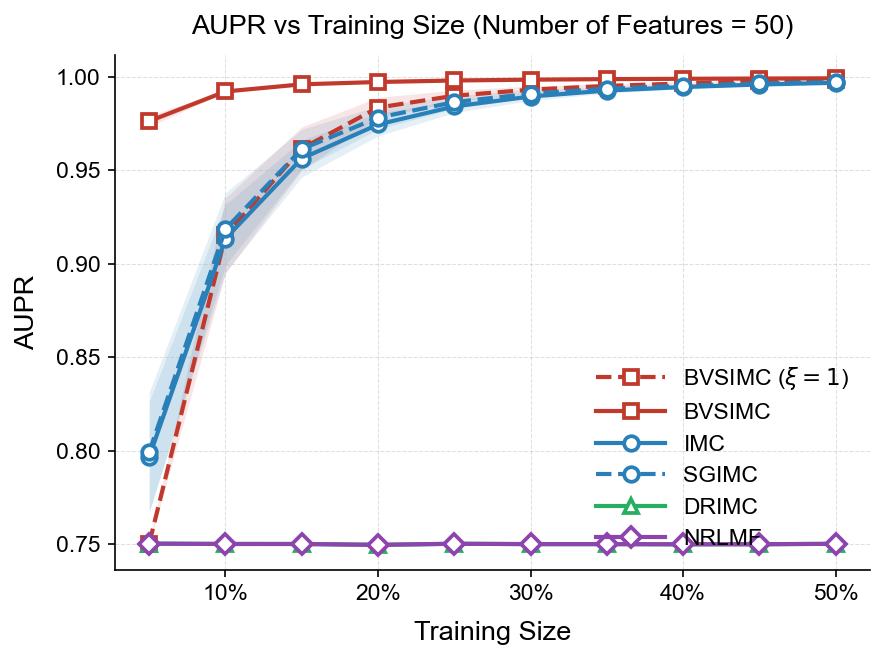

In [16]:
# individual plots
# plot_vs_train_size(final, metric="aupr", n_features=50)
plot_vs_train_size(
    final,
    metric="aupr",
    n_features=50,
    method_filters={"bissgl_xi1": {"xi": 1}},
)

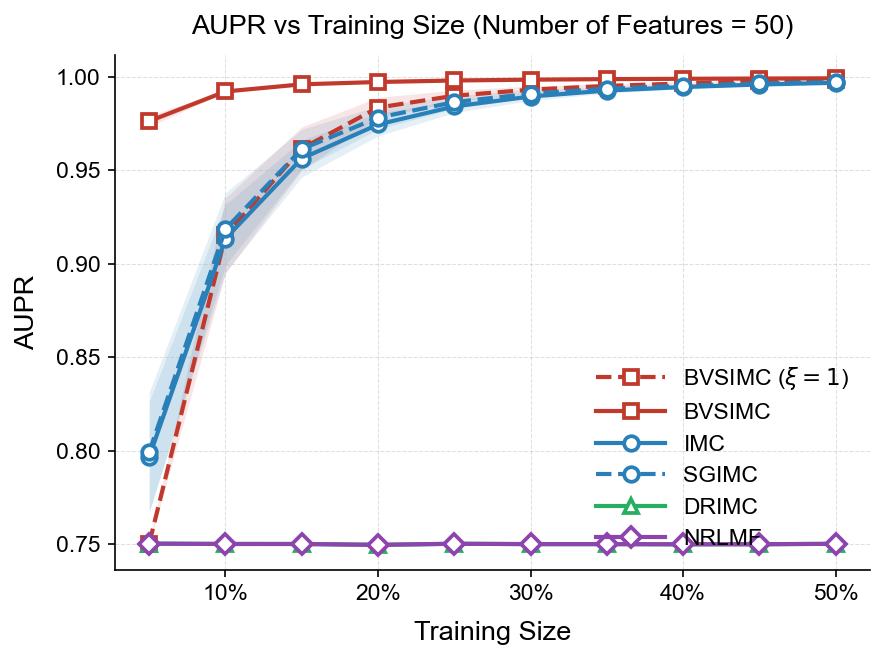

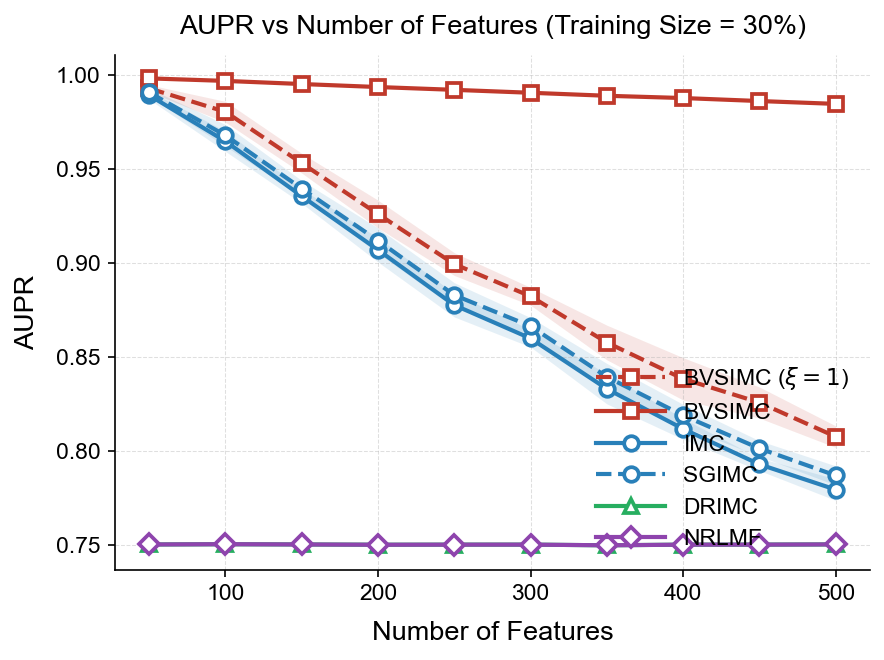

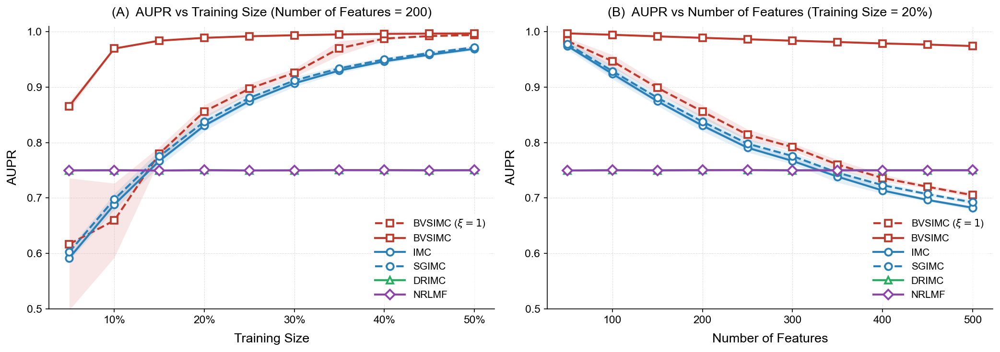

In [23]:
plot_vs_train_size(
    final,
    metric="aupr",
    n_features=50,
    method_filters={"bissgl_xi1": {"xi": 1}},
)

plot_vs_n_features(
    final,
    metric="aupr",
    train_size=0.3,
    method_filters={"bissgl_xi1": {"xi": 1}},
)

plot_both(
    final,
    metric="aupr",
    method_filters={"bissgl_xi1": {"xi": 1}},
    n_features_for_train_plot=200,
    train_size_for_feature_plot=0.2,
)

---

In [ ]:
"""
Summarize real-application CV results with nested HP selection.

Structure
---------
Raw data: 5 trials × 10 folds × HP combos × 3 inner CV folds

Pipeline (mirrors simulation summarize_results.py)
---------------------------------------------------
Step 1: Average val_score across 3 inner CV folds
        → one row per (trial, fold, HP combo)

Step 2: Select best HP combo per (trial, fold) by val_metric
        → one row per (trial, fold)

Step 3: Retrieve test_score for the best combo per (trial, fold)
        (test_score is identical across inner CV folds for the same combo)
        → one row per (trial, fold)

Step 4: Average test_score across 10 folds per trial
        → one row per trial

Step 5: Mean ± std across 5 trials
        → final summary
"""

import os
import gzip
import pickle
import numpy as np
import pandas as pd

# ====== score vector column names (matches get_metrics return order) ======
SCORE_COLS = ["aupr", "auc", "f1", "accuracy", "recall", "specificity", "precision"]

# ====== hyperparam columns per method ======
HYPERPARAM_COLS = {
    "bissgl": [
        "xi",
        "eta",
        "tilde_lambda0",
        "tilde_lambda1",
        "lambda0",
        "lambda1",
        "K",
    ],
    "sgimc": ["C_lasso", "C_group", "C_ridge", "rank"],
    "imc": ["C_lasso", "C_group", "C_ridge", "lamb", "rank"],
    "drimc": ["lamU", "lamV", "cc", "iterpara", "numLat"],
    "nrlmf": [
        "cfix",
        "K1",
        "K2",
        "num_factors",
        "lambda_d",
        "lambda_t",
        "alpha",
        "beta",
        "theta",
        "max_iter",
    ],
}


# ====== load results — single stacked file or multiple task files ======
def load_results(output_dir, method_name):
    """
    Load results for a given method.

    Handles two layouts:
      1. Single stacked file:  results_<method>.gz       (from local runs)
      2. Multiple task files:  results_<method>_task*.gz  (from HPC runs)

    Returns
    -------
    pd.DataFrame  one row per (trial, fold, HP combo, inner CV fold)
    """
    single_file = os.path.join(output_dir, f"results_{method_name}.gz")
    if os.path.exists(single_file):
        with gzip.open(single_file, "rb") as fin:
            rows = pickle.load(fin)
    else:
        prefix = f"results_{method_name}_task"
        files = sorted(
            f
            for f in os.listdir(output_dir)
            if f.startswith(prefix) and f.endswith(".gz")
        )
        if not files:
            raise FileNotFoundError(
                f"No file 'results_{method_name}.gz' and no task files "
                f"matching '{prefix}*.gz' found in {output_dir}"
            )
        rows = []
        for fname in files:
            with gzip.open(os.path.join(output_dir, fname), "rb") as fin:
                rows.extend(pickle.load(fin))

    df = pd.DataFrame(rows)
    df["val_score"] = df["val_score"].apply(np.asarray)
    df["test_score"] = df["test_score"].apply(np.asarray)
    return df


# ====== expand score vector into named columns ======
def expand_scores(df, col, names=SCORE_COLS):
    """
    Expand a column of score vectors into individual named columns.
    e.g. 'val_score' → 'val_score_aupr', 'val_score_auc', ...
    """
    expanded = pd.DataFrame(
        np.stack(df[col].values),
        index=df.index,
        columns=[f"{col}_{n}" for n in names],
    )
    return expanded


# ====== main summarization pipeline ======
def summarize_results(df, hyperparam_cols, val_metric="aupr"):
    """
    Summarize real-application CV results with nested HP selection.

    Pipeline  (analogous to simulation summarize_results)
    --------
    1. Average val_score across 3 inner CV folds
       → per (trial, fold, HP combo)

    2. Select best HP combo per (trial, fold) by val_metric
       → per (trial, fold)

    3. Retrieve test_score for the best combo
       (test_score is identical across inner CV folds for the same HP combo,
        so we merge on (trial, fold, HPs) and take first row per (trial, fold))

    4. Average test_score across 10 folds per trial
       → per trial

    5. Mean ± std across 5 trials
       → single-row final summary

    Parameters
    ----------
    df             : pd.DataFrame  raw results from load_results()
    hyperparam_cols: list[str]     HP column names for this method
    val_metric     : str           score metric for HP selection (default: 'aupr')

    Returns
    -------
    dict with keys:
        'raw'            : original DataFrame (after any filters)
        'val_avg'        : Step 1 output
        'best_params'    : Step 2 output
        'test_per_fold'  : Step 3 output — test scores for best HP per (trial, fold)
        'test_per_trial' : Step 4 output — averaged across folds per trial
        'final'          : Step 5 output — mean ± std across trials
    """
    fold_cols = ["trial", "fold"]
    group_cols = fold_cols + hyperparam_cols

    # ------------------------------------------------------------------
    # Step 1: average val_score across inner CV folds
    #         group by (trial, fold, HP combo), average over cv=0,1,2
    # ------------------------------------------------------------------
    val_avg = df.groupby(group_cols, as_index=False).agg(
        val_score=("val_score", lambda x: np.mean(np.stack(x), axis=0)),
        val_d1=("val_d1", "mean"),
        val_d2=("val_d2", "mean"),
        n_inner_cv=("cv", "count"),  # diagnostic: should be 3
    )

    # expand val_score vector into named columns
    val_avg = pd.concat(
        [val_avg.drop(columns=["val_score"]), expand_scores(val_avg, "val_score")],
        axis=1,
    )
    val_metric_col = f"val_score_{val_metric}"

    # ------------------------------------------------------------------
    # Step 2: select best HP combo per (trial, fold)
    #         pick the HP combo with highest val_metric per outer fold
    # ------------------------------------------------------------------
    best_idx = val_avg.groupby(fold_cols)[val_metric_col].idxmax()
    best_params = val_avg.loc[
        best_idx, fold_cols + hyperparam_cols + [val_metric_col, "n_inner_cv"]
    ].reset_index(drop=True)

    # ------------------------------------------------------------------
    # Step 3: retrieve test_score for the best combo per (trial, fold)
    #         test_score is the same across inner CV folds for the same
    #         (trial, fold, HP) combo, so merge and deduplicate
    # ------------------------------------------------------------------
    df_best = df.merge(
        best_params[fold_cols + hyperparam_cols],
        on=fold_cols + hyperparam_cols,
        how="inner",
    )

    # detect available columns (feature selection indices may or may not exist)
    base_cols = fold_cols + hyperparam_cols + ["test_score", "test_d1", "test_d2"]
    sel_cols_available = [
        c
        for c in ["test_sel_W", "test_sel_H", "test_sel_A", "test_sel_B"]
        if c in df_best.columns
    ]
    keep_cols = base_cols + sel_cols_available

    # deduplicate: one row per (trial, fold)
    test_per_fold = df_best.groupby(fold_cols, as_index=False).first()[keep_cols]

    # expand test_score vector into named columns
    test_per_fold = pd.concat(
        [
            test_per_fold.drop(columns=["test_score"]),
            expand_scores(test_per_fold, "test_score"),
        ],
        axis=1,
    )

    # ------------------------------------------------------------------
    # Step 4: average test_score across 10 folds per trial
    # ------------------------------------------------------------------
    test_score_cols = [f"test_score_{n}" for n in SCORE_COLS]

    test_per_trial = test_per_fold.groupby("trial", as_index=False).agg(
        **{c: (c, "mean") for c in test_score_cols},
        test_d1_mean=("test_d1", "mean"),
        test_d2_mean=("test_d2", "mean"),
        n_folds=("fold", "count"),
    )

    # ------------------------------------------------------------------
    # Step 5: mean ± std across 5 trials
    # ------------------------------------------------------------------
    final = {}
    for c in test_score_cols:
        vals = test_per_trial[c].values
        final[f"{c}_mean"] = vals.mean()
        final[f"{c}_std"] = vals.std(ddof=1)
    final["test_d1_mean"] = test_per_trial["test_d1_mean"].mean()
    final["test_d2_mean"] = test_per_trial["test_d2_mean"].mean()
    final["n_trials"] = len(test_per_trial)
    final["n_folds_per_trial"] = int(test_per_trial["n_folds"].iloc[0])
    final = pd.DataFrame([final])

    return {
        "raw": df,
        "val_avg": val_avg,
        "best_params": best_params,
        "test_per_fold": test_per_fold,
        "test_per_trial": test_per_trial,
        "final": final,
    }


# ====== convenience wrapper per method ======
def summarize_method(output_dir, method_name, val_metric="aupr", filters=None):
    """
    Load results and summarize for a given method in one call.

    Parameters
    ----------
    output_dir  : str   path to result files
    method_name : str   one of 'bissgl', 'sgimc', 'imc', 'drimc', 'nrlmf'
    val_metric  : str   score metric for HP selection (default: 'aupr')
    filters     : dict  optional column filters, e.g. {"xi": 1}

    Example
    -------
    results = summarize_method(
        "/work/sfan/projects/BiSSGL/outputs/results/realAnalysis/tuberculosis/fold_cv",
        "bissgl", val_metric="aupr", filters={"xi": 1},
    )
    print_summary(results, "BVSIMC (xi=1)")
    """
    hyperparam_cols = HYPERPARAM_COLS[method_name]
    df = load_results(output_dir, method_name)

    if filters is not None:
        for col, val in filters.items():
            df = df[df[col] == val]
        df = df.reset_index(drop=True)

    return summarize_results(df, hyperparam_cols, val_metric=val_metric)


# ====== diagnostics ======
def check_completeness(results, method_name, expected_trials=5, expected_folds=10):
    """
    Print diagnostic info to verify results are complete.

    Checks:
    - Number of raw rows
    - Number of (trial, fold) pairs with results
    - Number of inner CV folds per combo
    - Number of HP combos per fold
    """
    df = results["raw"]
    tpf = results["test_per_fold"]

    n_raw = len(df)
    n_outer_folds = len(tpf)
    expected_outer = expected_trials * expected_folds

    # count unique HP combos
    hyperparam_cols = HYPERPARAM_COLS[method_name]
    hp_combos = df.groupby(hyperparam_cols).ngroups

    # inner CV fold count per combo
    inner_counts = df.groupby(["trial", "fold"] + hyperparam_cols)["cv"].count()

    print(f"\n{'='*60}")
    print(f"  Diagnostics: {method_name}")
    print(f"{'='*60}")
    print(f"  Raw result rows:             {n_raw}")
    print(f"  HP combos:                   {hp_combos}")
    print(f"  Expected inner CV per combo:  3")
    print(f"  Actual inner CV (min/max):    {inner_counts.min()}/{inner_counts.max()}")
    print(f"  Outer folds with results:    {n_outer_folds} / {expected_outer} expected")

    # check for missing (trial, fold) pairs
    all_pairs = set(
        (t, f) for t in range(expected_trials) for f in range(expected_folds)
    )
    present_pairs = set(zip(tpf["trial"], tpf["fold"]))
    missing = all_pairs - present_pairs
    if missing:
        print(f"  *** MISSING folds: {sorted(missing)}")
    else:
        print(f"  All {expected_outer} outer folds present ✓")
    print(f"{'='*60}\n")


# ====== pretty-print single method ======
def print_summary(results, method_label="Method"):
    """Print a compact summary of the final results."""
    final = results["final"]
    n_trials = int(final["n_trials"].iloc[0])
    n_folds = int(final["n_folds_per_trial"].iloc[0])
    print(f"\n{'='*60}")
    print(f"  {method_label}  —  {n_trials} trials × {n_folds}-fold CV")
    print(f"{'='*60}")
    for metric in SCORE_COLS:
        m = final[f"test_score_{metric}_mean"].iloc[0]
        s = final[f"test_score_{metric}_std"].iloc[0]
        print(f"  {metric:>12s}:  {m:.4f} ± {s:.4f}")
    print(f"  {'d1 (mean)':>12s}:  {final['test_d1_mean'].iloc[0]:.1f}")
    print(f"  {'d2 (mean)':>12s}:  {final['test_d2_mean'].iloc[0]:.1f}")
    print(f"{'='*60}\n")


# ====== pretty-print comparison across methods ======
def print_all_summaries(all_results):
    """
    Print a comparison table across all methods.

    Parameters
    ----------
    all_results : dict  {method_label: results_dict}
                  e.g. {"BVSIMC": results_bissgl, "SGIMC": results_sgimc, ...}

    Example
    -------
    all_results = {
        "BVSIMC":  summarize_method(PATH, "bissgl", filters={"xi": 1}),
        "SGIMC":   summarize_method(PATH, "sgimc"),
        "IMC":     summarize_method(PATH, "imc"),
        "DRIMC":   summarize_method(PATH, "drimc"),
        "NRLMF":   summarize_method(PATH, "nrlmf"),
    }
    print_all_summaries(all_results)
    """
    methods = list(all_results.keys())
    col_w = max(16, max(len(m) for m in methods) + 2)

    # header
    print(f"\n{'='*(14 + col_w * len(methods) + 2 * len(methods))}")
    print(f"  {'Metric':<14s}", end="")
    for m in methods:
        print(f"  {m:>{col_w}s}", end="")
    print()
    print(f"{'='*(14 + col_w * len(methods) + 2 * len(methods))}")

    for metric in SCORE_COLS:
        print(f"  {metric:<14s}", end="")
        for m in methods:
            final = all_results[m]["final"]
            mean = final[f"test_score_{metric}_mean"].iloc[0]
            std = final[f"test_score_{metric}_std"].iloc[0]
            print(f"  {mean:.4f}±{std:.4f}", end="")
        print()

    # d1, d2
    for d_metric, d_label in [
        ("test_d1_mean", "d1 (mean)"),
        ("test_d2_mean", "d2 (mean)"),
    ]:
        print(f"  {d_label:<14s}", end="")
        for m in methods:
            val = all_results[m]["final"][d_metric].iloc[0]
            print(f"  {val:>{col_w}.1f}", end="")
        print()

    print(f"{'='*(14 + col_w * len(methods) + 2 * len(methods))}\n")


# ====== feature selection frequency analysis ======
def get_feature_frequency(results, sel_col, feature_names=None):
    """
    Count selection frequency and aggregate importance (L2 norm) across folds.

    The sel_col column should contain dicts of {feature_idx: L2_row_norm}.
    Only works for methods that store feature selection info
    (BiSSGL: test_sel_A / test_sel_B,  SGIMC: test_sel_W / test_sel_H).

    Parameters
    ----------
    results       : dict   output of summarize_method()
    sel_col       : str    column name, e.g. 'test_sel_A' or 'test_sel_W'
    feature_names : list   optional feature names to map indices to

    Returns
    -------
    pd.DataFrame  sorted by frequency (descending), with columns:
        feature_idx   : int     0-based feature index
        feature_name  : str     (if feature_names provided)
        count         : int     number of folds where this feature was selected
        frequency     : float   count / total number of folds
        norm_mean     : float   mean L2 row norm across folds where selected
        norm_std      : float   std of L2 row norm across those folds
    """
    tpf = results["test_per_fold"]

    if sel_col not in tpf.columns:
        available = [c for c in tpf.columns if c.startswith("test_sel_")]
        raise KeyError(
            f"Column '{sel_col}' not found in test_per_fold. "
            f"Available selection columns: {available}"
        )

    n_folds = len(tpf)

    # collect all norms per feature index
    from collections import defaultdict

    norms_by_idx = defaultdict(list)
    for sel_dict in tpf[sel_col]:
        if isinstance(sel_dict, dict):
            for idx, norm in sel_dict.items():
                norms_by_idx[int(idx)].append(float(norm))
        else:
            # backward compatibility: plain list of indices (no norms)
            for idx in sel_dict:
                norms_by_idx[int(idx)].append(np.nan)

    # build output DataFrame
    rows = []
    for feat_idx in sorted(norms_by_idx.keys()):
        norms = norms_by_idx[feat_idx]
        row = {
            "feature_idx": feat_idx,
            "count": len(norms),
            "frequency": len(norms) / n_folds,
            "norm_mean": float(np.nanmean(norms)),
            "norm_std": float(np.nanstd(norms, ddof=1)) if len(norms) > 1 else 0.0,
        }
        if feature_names is not None:
            row["feature_name"] = feature_names[feat_idx]
        rows.append(row)

    freq_df = pd.DataFrame(rows)

    # order columns nicely
    col_order = ["feature_idx"]
    if feature_names is not None:
        col_order.append("feature_name")
    col_order.extend(["count", "frequency", "norm_mean", "norm_std"])
    freq_df = (
        freq_df[col_order].sort_values("count", ascending=False).reset_index(drop=True)
    )

    return freq_df


def print_top_features(freq_df, top_n=20, label="Features"):
    """Print the top-N most frequently selected features with importance."""
    n_total = (
        int(round(freq_df["count"].iloc[0] / freq_df["frequency"].iloc[0]))
        if len(freq_df) > 0
        else 0
    )
    print(f"\n{'='*70}")
    print(f"  Top {top_n} {label}  (out of {n_total} outer folds)")
    print(f"{'='*70}")
    has_name = "feature_name" in freq_df.columns
    has_norm = "norm_mean" in freq_df.columns and not freq_df["norm_mean"].isna().all()
    for _, row in freq_df.head(top_n).iterrows():
        name_str = f"  {row['feature_name']}" if has_name else ""
        norm_str = (
            f"  ||r||={row['norm_mean']:.3f}±{row['norm_std']:.3f}" if has_norm else ""
        )
        print(
            f"  idx {row['feature_idx']:>4d}{name_str:30s}  "
            f"count={row['count']:>3d}  freq={row['frequency']:.0%}{norm_str}"
        )
    print(f"{'='*70}\n")

# Start from here

In [8]:
"""
Summarize real-application CV results with nested HP selection.

Structure
---------
Raw data: 5 trials × 10 folds × HP combos × 3 inner CV folds

Pipeline (mirrors simulation summarize_results.py)
---------------------------------------------------
Step 1: Average val_score across 3 inner CV folds
        → one row per (trial, fold, HP combo)

Step 2: Select best HP combo per (trial, fold) by val_metric
        → one row per (trial, fold)

Step 3: Retrieve test_score for the best combo per (trial, fold)
        (test_score is identical across inner CV folds for the same combo)
        → one row per (trial, fold)

Step 4: Average test_score across 10 folds per trial
        → one row per trial

Step 5: Mean ± std across 5 trials
        → final summary
"""

import os
import gzip
import pickle
import numpy as np
import pandas as pd

# ====== score vector column names (matches get_metrics return order) ======
SCORE_COLS = ["aupr", "auc", "f1", "accuracy", "recall", "specificity", "precision"]

# ====== hyperparam columns per method ======
HYPERPARAM_COLS = {
    "bissgl": [
        "xi",
        "eta",
        "tilde_lambda0",
        "tilde_lambda1",
        "lambda0",
        "lambda1",
        "K",
    ],
    "sgimc": ["C_lasso", "C_group", "C_ridge", "rank"],
    "imc": ["C_lasso", "C_group", "C_ridge", "lamb", "rank"],
    "drimc": ["lamU", "lamV", "cc", "iterpara", "numLat"],
    "nrlmf": [
        "cfix",
        "K1",
        "K2",
        "num_factors",
        "lambda_d",
        "lambda_t",
        "alpha",
        "beta",
        "theta",
        "max_iter",
    ],
}


# ====== load results — single stacked file or multiple task files ======
def load_results(output_dir, method_name):
    """
    Load results for a given method.

    Handles two layouts:
      1. Single stacked file:  results_<method>.gz       (from local runs)
      2. Multiple task files:  results_<method>_task*.gz  (from HPC runs)

    Returns
    -------
    pd.DataFrame  one row per (trial, fold, HP combo, inner CV fold)
    """
    single_file = os.path.join(output_dir, f"results_{method_name}.gz")
    if os.path.exists(single_file):
        with gzip.open(single_file, "rb") as fin:
            rows = pickle.load(fin)
    else:
        prefix = f"results_{method_name}_task"
        files = sorted(
            f
            for f in os.listdir(output_dir)
            if f.startswith(prefix) and f.endswith(".gz")
        )
        if not files:
            raise FileNotFoundError(
                f"No file 'results_{method_name}.gz' and no task files "
                f"matching '{prefix}*.gz' found in {output_dir}"
            )
        rows = []
        for fname in files:
            with gzip.open(os.path.join(output_dir, fname), "rb") as fin:
                rows.extend(pickle.load(fin))

    df = pd.DataFrame(rows)
    df["val_score"] = df["val_score"].apply(np.asarray)
    df["test_score"] = df["test_score"].apply(np.asarray)
    return df


# ====== expand score vector into named columns ======
def expand_scores(df, col, names=SCORE_COLS):
    """
    Expand a column of score vectors into individual named columns.
    e.g. 'val_score' → 'val_score_aupr', 'val_score_auc', ...
    """
    expanded = pd.DataFrame(
        np.stack(df[col].values),
        index=df.index,
        columns=[f"{col}_{n}" for n in names],
    )
    return expanded


# ====== main summarization pipeline ======
def summarize_results(
    df, hyperparam_cols, val_metric="aupr", n_orig_U=None, n_orig_V=None
):
    """
    Summarize real-application CV results with nested HP selection.

    Pipeline  (analogous to simulation summarize_results)
    --------
    1. Average val_score across 3 inner CV folds
       → per (trial, fold, HP combo)

    2. Select best HP combo per (trial, fold) by val_metric
       → per (trial, fold)

    3. Retrieve test_score for the best combo
       (test_score is identical across inner CV folds for the same HP combo,
        so we merge on (trial, fold, HPs) and take first row per (trial, fold))

    4. Average test_score across 10 folds per trial
       → per trial

    5. Mean ± std across 5 trials
       → single-row final summary

    Parameters
    ----------
    df             : pd.DataFrame  raw results from load_results()
    hyperparam_cols: list[str]     HP column names for this method
    val_metric     : str           score metric for HP selection (default: 'aupr')
    n_orig_U       : int or None   number of original drug-side features (before
                                   identity augmentation); if given, d1_orig is
                                   recomputed excluding augmented indices
    n_orig_V       : int or None   number of original target-side features

    Returns
    -------
    dict with keys:
        'raw'            : original DataFrame (after any filters)
        'val_avg'        : Step 1 output
        'best_params'    : Step 2 output
        'test_per_fold'  : Step 3 output — test scores for best HP per (trial, fold)
        'test_per_trial' : Step 4 output — averaged across folds per trial
        'final'          : Step 5 output — mean ± std across trials
    """
    fold_cols = ["trial", "fold"]
    group_cols = fold_cols + hyperparam_cols

    # ------------------------------------------------------------------
    # Step 1: average val_score across inner CV folds
    #         group by (trial, fold, HP combo), average over cv=0,1,2
    # ------------------------------------------------------------------
    val_avg = df.groupby(group_cols, as_index=False).agg(
        val_score=("val_score", lambda x: np.mean(np.stack(x), axis=0)),
        val_d1=("val_d1", "mean"),
        val_d2=("val_d2", "mean"),
        n_inner_cv=("cv", "count"),  # diagnostic: should be 3
    )

    # expand val_score vector into named columns
    val_avg = pd.concat(
        [val_avg.drop(columns=["val_score"]), expand_scores(val_avg, "val_score")],
        axis=1,
    )
    val_metric_col = f"val_score_{val_metric}"

    # ------------------------------------------------------------------
    # Step 2: select best HP combo per (trial, fold)
    #         pick the HP combo with highest val_metric per outer fold
    # ------------------------------------------------------------------
    best_idx = val_avg.groupby(fold_cols)[val_metric_col].idxmax()
    best_params = val_avg.loc[
        best_idx, fold_cols + hyperparam_cols + [val_metric_col, "n_inner_cv"]
    ].reset_index(drop=True)

    # ------------------------------------------------------------------
    # Step 3: retrieve test_score for the best combo per (trial, fold)
    #         test_score is the same across inner CV folds for the same
    #         (trial, fold, HP) combo, so merge and deduplicate
    # ------------------------------------------------------------------
    df_best = df.merge(
        best_params[fold_cols + hyperparam_cols],
        on=fold_cols + hyperparam_cols,
        how="inner",
    )

    # detect available columns (feature selection indices may or may not exist)
    base_cols = fold_cols + hyperparam_cols + ["test_score", "test_d1", "test_d2"]
    sel_cols_available = [
        c
        for c in ["test_sel_W", "test_sel_H", "test_sel_A", "test_sel_B"]
        if c in df_best.columns
    ]
    keep_cols = base_cols + sel_cols_available

    # deduplicate: one row per (trial, fold)
    test_per_fold = df_best.groupby(fold_cols, as_index=False).first()[keep_cols]

    # expand test_score vector into named columns
    test_per_fold = pd.concat(
        [
            test_per_fold.drop(columns=["test_score"]),
            expand_scores(test_per_fold, "test_score"),
        ],
        axis=1,
    )

    # ------------------------------------------------------------------
    # Step 3b: recompute d1/d2 excluding augmented identity features
    #          (only when n_orig_U / n_orig_V is provided and sel dicts exist)
    # ------------------------------------------------------------------
    # d1 = drug-side: test_sel_A (BiSSGL) or test_sel_W (SGIMC)
    d1_sel_col = next(
        (c for c in ["test_sel_A", "test_sel_W"] if c in test_per_fold.columns), None
    )
    # d2 = target-side: test_sel_B (BiSSGL) or test_sel_H (SGIMC)
    d2_sel_col = next(
        (c for c in ["test_sel_B", "test_sel_H"] if c in test_per_fold.columns), None
    )

    if n_orig_U is not None and d1_sel_col is not None:
        test_per_fold["test_d1_orig"] = test_per_fold[d1_sel_col].apply(
            lambda d: sum(
                1 for k in (d.keys() if isinstance(d, dict) else d) if int(k) < n_orig_U
            )
        )
    if n_orig_V is not None and d2_sel_col is not None:
        test_per_fold["test_d2_orig"] = test_per_fold[d2_sel_col].apply(
            lambda d: sum(
                1 for k in (d.keys() if isinstance(d, dict) else d) if int(k) < n_orig_V
            )
        )

    # ------------------------------------------------------------------
    # Step 4: average test_score across 10 folds per trial
    # ------------------------------------------------------------------
    test_score_cols = [f"test_score_{n}" for n in SCORE_COLS]
    has_d1_orig = "test_d1_orig" in test_per_fold.columns
    has_d2_orig = "test_d2_orig" in test_per_fold.columns

    agg_dict = {
        **{c: (c, "mean") for c in test_score_cols},
        "test_d1_mean": ("test_d1", "mean"),
        "test_d2_mean": ("test_d2", "mean"),
        "n_folds": ("fold", "count"),
    }
    if has_d1_orig:
        agg_dict["test_d1_orig_mean"] = ("test_d1_orig", "mean")
    if has_d2_orig:
        agg_dict["test_d2_orig_mean"] = ("test_d2_orig", "mean")

    test_per_trial = test_per_fold.groupby("trial", as_index=False).agg(**agg_dict)

    # ------------------------------------------------------------------
    # Step 5: mean ± std across 5 trials
    # ------------------------------------------------------------------
    final = {}
    for c in test_score_cols:
        vals = test_per_trial[c].values
        final[f"{c}_mean"] = vals.mean()
        final[f"{c}_std"] = vals.std(ddof=1)
    final["test_d1_mean"] = test_per_trial["test_d1_mean"].mean()
    final["test_d2_mean"] = test_per_trial["test_d2_mean"].mean()
    if has_d1_orig:
        final["test_d1_orig_mean"] = test_per_trial["test_d1_orig_mean"].mean()
    if has_d2_orig:
        final["test_d2_orig_mean"] = test_per_trial["test_d2_orig_mean"].mean()
    final["n_trials"] = len(test_per_trial)
    final["n_folds_per_trial"] = int(test_per_trial["n_folds"].iloc[0])
    final = pd.DataFrame([final])

    return {
        "raw": df,
        "val_avg": val_avg,
        "best_params": best_params,
        "test_per_fold": test_per_fold,
        "test_per_trial": test_per_trial,
        "final": final,
    }


def summarize_results_pooled(
    df, hyperparam_cols, val_metric="aupr", n_orig_U=None, n_orig_V=None
):
    """
    Alternative summarization: pool all 50 folds directly.

    Same as summarize_results Steps 1-3 (pick best HP per fold by val_metric,
    retrieve test scores), but then average across ALL 50 folds directly
    instead of grouping by trial first.

    This allows each (trial, fold) to use a different HP combo, and reports
    mean ± std across all 50 folds. Useful to compare with the per-trial
    approach: if results are similar, HP selection is stable.

    Returns
    -------
    dict with same keys as summarize_results, except:
        'test_per_trial' is absent
        'final'          is mean ± std across all 50 folds (not 5 trials)
    """
    # Steps 1-3 are identical — reuse summarize_results
    results = summarize_results(
        df, hyperparam_cols, val_metric=val_metric, n_orig_U=n_orig_U, n_orig_V=n_orig_V
    )

    test_per_fold = results["test_per_fold"]
    test_score_cols = [f"test_score_{n}" for n in SCORE_COLS]

    # ------------------------------------------------------------------
    # Pooled averaging: mean ± std across all N folds directly
    # ------------------------------------------------------------------
    n_folds_total = len(test_per_fold)
    final = {}
    for c in test_score_cols:
        vals = test_per_fold[c].values
        final[f"{c}_mean"] = vals.mean()
        final[f"{c}_std"] = vals.std(ddof=1)
    final["test_d1_mean"] = test_per_fold["test_d1"].mean()
    final["test_d2_mean"] = test_per_fold["test_d2"].mean()
    if "test_d1_orig" in test_per_fold.columns:
        final["test_d1_orig_mean"] = test_per_fold["test_d1_orig"].mean()
    if "test_d2_orig" in test_per_fold.columns:
        final["test_d2_orig_mean"] = test_per_fold["test_d2_orig"].mean()
    final["n_folds_total"] = n_folds_total
    final["averaging"] = "pooled"
    final = pd.DataFrame([final])

    return {
        "raw": results["raw"],
        "val_avg": results["val_avg"],
        "best_params": results["best_params"],
        "test_per_fold": test_per_fold,
        "final": final,
    }


# ====== convenience wrapper per method ======
def summarize_method(
    output_dir,
    method_name,
    val_metric="aupr",
    filters=None,
    pooled=False,
    n_orig_U=None,
    n_orig_V=None,
):
    """
    Load results and summarize for a given method in one call.

    Parameters
    ----------
    output_dir  : str   path to result files
    method_name : str   one of 'bissgl', 'sgimc', 'imc', 'drimc', 'nrlmf'
    val_metric  : str   score metric for HP selection (default: 'aupr')
    filters     : dict  optional column filters, e.g. {"xi": 1}
    pooled      : bool  if True, average across all 50 folds directly
                        (HP can vary per fold); if False (default),
                        average within each trial first, then across trials.
    n_orig_U    : int   original drug-side feature count (before identity
                        augmentation); d1 summary will exclude augmented features
    n_orig_V    : int   original target-side feature count

    Example
    -------
    # Standard with original-only feature counts
    res = summarize_method(PATH, "bissgl", filters={"xi": 1},
                           n_orig_U=9000, n_orig_V=33)
    """
    hyperparam_cols = HYPERPARAM_COLS[method_name]
    df = load_results(output_dir, method_name)

    if filters is not None:
        for col, val in filters.items():
            df = df[df[col] == val]
        df = df.reset_index(drop=True)

    if pooled:
        return summarize_results_pooled(
            df,
            hyperparam_cols,
            val_metric=val_metric,
            n_orig_U=n_orig_U,
            n_orig_V=n_orig_V,
        )
    else:
        return summarize_results(
            df,
            hyperparam_cols,
            val_metric=val_metric,
            n_orig_U=n_orig_U,
            n_orig_V=n_orig_V,
        )


# ====== diagnostics ======
def check_completeness(results, method_name, expected_trials=5, expected_folds=10):
    """
    Print diagnostic info to verify results are complete.

    Checks:
    - Number of raw rows
    - Number of (trial, fold) pairs with results
    - Number of inner CV folds per combo
    - Number of HP combos per fold
    """
    df = results["raw"]
    tpf = results["test_per_fold"]

    n_raw = len(df)
    n_outer_folds = len(tpf)
    expected_outer = expected_trials * expected_folds

    # count unique HP combos
    hyperparam_cols = HYPERPARAM_COLS[method_name]
    hp_combos = df.groupby(hyperparam_cols).ngroups

    # inner CV fold count per combo
    inner_counts = df.groupby(["trial", "fold"] + hyperparam_cols)["cv"].count()

    print(f"\n{'='*60}")
    print(f"  Diagnostics: {method_name}")
    print(f"{'='*60}")
    print(f"  Raw result rows:             {n_raw}")
    print(f"  HP combos:                   {hp_combos}")
    print(f"  Expected inner CV per combo:  3")
    print(f"  Actual inner CV (min/max):    {inner_counts.min()}/{inner_counts.max()}")
    print(f"  Outer folds with results:    {n_outer_folds} / {expected_outer} expected")

    # check for missing (trial, fold) pairs
    all_pairs = set(
        (t, f) for t in range(expected_trials) for f in range(expected_folds)
    )
    present_pairs = set(zip(tpf["trial"], tpf["fold"]))
    missing = all_pairs - present_pairs
    if missing:
        print(f"  *** MISSING folds: {sorted(missing)}")
    else:
        print(f"  All {expected_outer} outer folds present ✓")
    print(f"{'='*60}\n")


# ====== pretty-print single method ======
def print_summary(results, method_label="Method"):
    """Print a compact summary of the final results (handles both averaging modes)."""
    final = results["final"]

    # detect averaging mode
    if "averaging" in final.columns and final["averaging"].iloc[0] == "pooled":
        n = int(final["n_folds_total"].iloc[0])
        subtitle = f"pooled across {n} folds (HP varies per fold)"
    else:
        n_trials = int(final["n_trials"].iloc[0])
        n_folds = int(final["n_folds_per_trial"].iloc[0])
        subtitle = f"{n_trials} trials × {n_folds}-fold CV"

    print(f"\n{'='*60}")
    print(f"  {method_label}  —  {subtitle}")
    print(f"{'='*60}")
    for metric in SCORE_COLS:
        m = final[f"test_score_{metric}_mean"].iloc[0]
        s = final[f"test_score_{metric}_std"].iloc[0]
        print(f"  {metric:>12s}:  {m:.4f} ± {s:.4f}")

    # d1/d2: show original-only count if available, otherwise total
    has_d1_orig = "test_d1_orig_mean" in final.columns
    has_d2_orig = "test_d2_orig_mean" in final.columns

    d1_total = final["test_d1_mean"].iloc[0]
    d2_total = final["test_d2_mean"].iloc[0]

    if has_d1_orig:
        d1_orig = final["test_d1_orig_mean"].iloc[0]
        print(
            f"  {'d1 (orig)':>12s}:  {d1_orig:.1f}  (total incl. augmented: {d1_total:.1f})"
        )
    else:
        print(f"  {'d1 (mean)':>12s}:  {d1_total:.1f}")

    if has_d2_orig:
        d2_orig = final["test_d2_orig_mean"].iloc[0]
        print(
            f"  {'d2 (orig)':>12s}:  {d2_orig:.1f}  (total incl. augmented: {d2_total:.1f})"
        )
    else:
        print(f"  {'d2 (mean)':>12s}:  {d2_total:.1f}")

    print(f"{'='*60}\n")


# ====== pretty-print comparison across methods ======
def print_all_summaries(all_results):
    """
    Print a comparison table across all methods.

    Parameters
    ----------
    all_results : dict  {method_label: results_dict}
                  e.g. {"BVSIMC": results_bissgl, "SGIMC": results_sgimc, ...}

    Example
    -------
    all_results = {
        "BVSIMC":  summarize_method(PATH, "bissgl", filters={"xi": 1}),
        "SGIMC":   summarize_method(PATH, "sgimc"),
        "IMC":     summarize_method(PATH, "imc"),
        "DRIMC":   summarize_method(PATH, "drimc"),
        "NRLMF":   summarize_method(PATH, "nrlmf"),
    }
    print_all_summaries(all_results)
    """
    methods = list(all_results.keys())
    col_w = max(16, max(len(m) for m in methods) + 2)

    # header
    print(f"\n{'='*(14 + col_w * len(methods) + 2 * len(methods))}")
    print(f"  {'Metric':<14s}", end="")
    for m in methods:
        print(f"  {m:>{col_w}s}", end="")
    print()
    print(f"{'='*(14 + col_w * len(methods) + 2 * len(methods))}")

    for metric in SCORE_COLS:
        print(f"  {metric:<14s}", end="")
        for m in methods:
            final = all_results[m]["final"]
            mean = final[f"test_score_{metric}_mean"].iloc[0]
            std = final[f"test_score_{metric}_std"].iloc[0]
            print(f"  {mean:.4f}±{std:.4f}", end="")
        print()

    # d1, d2
    for d_metric, d_label in [
        ("test_d1_mean", "d1 (mean)"),
        ("test_d2_mean", "d2 (mean)"),
    ]:
        print(f"  {d_label:<14s}", end="")
        for m in methods:
            val = all_results[m]["final"][d_metric].iloc[0]
            print(f"  {val:>{col_w}.1f}", end="")
        print()

    print(f"{'='*(14 + col_w * len(methods) + 2 * len(methods))}\n")


# ====== feature selection frequency analysis ======
def get_feature_frequency(results, sel_col, feature_names=None, n_orig=None):
    """
    Count selection frequency and aggregate importance (L2 norm) across folds.

    The sel_col column should contain dicts of {feature_idx: L2_row_norm}.
    Only works for methods that store feature selection info
    (BiSSGL: test_sel_A / test_sel_B,  SGIMC: test_sel_W / test_sel_H).

    Parameters
    ----------
    results       : dict   output of summarize_method()
    sel_col       : str    column name, e.g. 'test_sel_A' or 'test_sel_W'
    feature_names : list   optional feature names to map indices to
    n_orig        : int    if given, exclude features with index >= n_orig
                           (i.e. the identity-augmented columns)

    Returns
    -------
    pd.DataFrame  sorted by frequency (descending), with columns:
        feature_idx   : int     0-based feature index
        feature_name  : str     (if feature_names provided)
        count         : int     number of folds where this feature was selected
        frequency     : float   count / total number of folds
        norm_mean     : float   mean L2 row norm across folds where selected
        norm_std      : float   std of L2 row norm across those folds

    Example
    -------
    # n_orig_U = 9000 original features, augmented with 6000-dim identity
    freq_A = get_feature_frequency(results, "test_sel_A", n_orig=9000)
    # → only features 0..8999 are reported; identity columns 9000+ excluded
    """
    tpf = results["test_per_fold"]

    if sel_col not in tpf.columns:
        available = [c for c in tpf.columns if c.startswith("test_sel_")]
        raise KeyError(
            f"Column '{sel_col}' not found in test_per_fold. "
            f"Available selection columns: {available}"
        )

    n_folds = len(tpf)

    # collect all norms per feature index
    from collections import defaultdict

    norms_by_idx = defaultdict(list)
    for sel_dict in tpf[sel_col]:
        if isinstance(sel_dict, dict):
            for idx, norm in sel_dict.items():
                idx = int(idx)
                if n_orig is not None and idx >= n_orig:
                    continue  # skip augmented identity features
                norms_by_idx[idx].append(float(norm))
        else:
            # backward compatibility: plain list of indices (no norms)
            for idx in sel_dict:
                idx = int(idx)
                if n_orig is not None and idx >= n_orig:
                    continue
                norms_by_idx[idx].append(np.nan)

    # build output DataFrame
    rows = []
    for feat_idx in sorted(norms_by_idx.keys()):
        norms = norms_by_idx[feat_idx]
        row = {
            "feature_idx": feat_idx,
            "count": len(norms),
            "frequency": len(norms) / n_folds,
            "norm_mean": float(np.nanmean(norms)),
            "norm_std": float(np.nanstd(norms, ddof=1)) if len(norms) > 1 else 0.0,
        }
        if feature_names is not None:
            row["feature_name"] = feature_names[feat_idx]
        rows.append(row)

    freq_df = pd.DataFrame(rows)

    if len(freq_df) == 0:
        return freq_df

    # order columns nicely
    col_order = ["feature_idx"]
    if feature_names is not None:
        col_order.append("feature_name")
    col_order.extend(["count", "frequency", "norm_mean", "norm_std"])
    freq_df = (
        freq_df[col_order].sort_values("count", ascending=False).reset_index(drop=True)
    )

    return freq_df


def print_top_features(freq_df, top_n=20, label="Features"):
    """Print the top-N most frequently selected features with importance."""
    n_total = (
        int(round(freq_df["count"].iloc[0] / freq_df["frequency"].iloc[0]))
        if len(freq_df) > 0
        else 0
    )
    print(f"\n{'='*70}")
    print(f"  Top {top_n} {label}  (out of {n_total} outer folds)")
    print(f"{'='*70}")
    has_name = "feature_name" in freq_df.columns
    has_norm = "norm_mean" in freq_df.columns and not freq_df["norm_mean"].isna().all()
    for _, row in freq_df.head(top_n).iterrows():
        name_str = f"  {row['feature_name']}" if has_name else ""
        norm_str = (
            f"  ||r||={row['norm_mean']:.3f}±{row['norm_std']:.3f}" if has_norm else ""
        )
        print(
            f"  idx {row['feature_idx']:>4d}{name_str:30s}  "
            f"count={row['count']:>3d}  freq={row['frequency']:.0%}{norm_str}"
        )
    print(f"{'='*70}\n")

In [9]:
PATH_ROOT = "/Users/sijianfan/projects/BiSSGL"
PATH_DATA = os.path.join(PATH_ROOT, "datasets/realAnalysis/tuberculosis/cv_data")
PATH_OUTPUT = os.path.join(
    PATH_ROOT, "outputs/results/realAnalysis/tuberculosis/fold_cv/comb"
)

# summarize each method
res_b = summarize_method(PATH_OUTPUT, "bissgl")
res_s = summarize_method(PATH_OUTPUT, "sgimc")
res_i = summarize_method(PATH_OUTPUT, "imc")
res_d = summarize_method(PATH_OUTPUT, "drimc")
res_n = summarize_method(PATH_OUTPUT, "nrlmf")

# check completeness
for name, res in [
    ("bissgl", res_b),
    ("sgimc", res_s),
    ("imc", res_i),
    ("drimc", res_d),
    ("nrlmf", res_n),
]:
    check_completeness(res, name)

# side-by-side comparison
print_all_summaries(
    {
        "BVSIMC": res_b,
        "SGIMC": res_s,
        "IMC": res_i,
        "DRIMC": res_d,
        "NRLMF": res_n,
    }
)


  Diagnostics: bissgl
  Raw result rows:             1800
  HP combos:                   12
  Expected inner CV per combo:  3
  Actual inner CV (min/max):    3/3
  Outer folds with results:    50 / 50 expected
  All 50 outer folds present ✓


  Diagnostics: sgimc
  Raw result rows:             600
  HP combos:                   4
  Expected inner CV per combo:  3
  Actual inner CV (min/max):    3/3
  Outer folds with results:    50 / 50 expected
  All 50 outer folds present ✓


  Diagnostics: imc
  Raw result rows:             450
  HP combos:                   3
  Expected inner CV per combo:  3
  Actual inner CV (min/max):    3/3
  Outer folds with results:    50 / 50 expected
  All 50 outer folds present ✓


  Diagnostics: drimc
  Raw result rows:             900
  HP combos:                   6
  Expected inner CV per combo:  3
  Actual inner CV (min/max):    3/3
  Outer folds with results:    50 / 50 expected
  All 50 outer folds present ✓


  Diagnostics: nrlmf
  Raw result rows

In [ ]:
# feature selection (BiSSGL / SGIMC only)
freq_A = get_feature_frequency(res_b, "test_sel_A")
freq_A
# print_top_features(freq_A, top_n=20, label="Drug Features (A)")

,feature_idx,count,frequency,norm_mean,norm_std
0,0,50,1.0,1.047972,1.332624
1,37,50,1.0,3.737933,1.908786
2,30,50,1.0,1.445501,2.051608
3,32,50,1.0,1.540981,2.193482
4,33,50,1.0,2.749864,1.840739
5,34,50,1.0,1.410923,1.685653
6,35,50,1.0,0.322711,0.146515
7,36,50,1.0,2.376773,2.495341
8,38,50,1.0,1.927731,1.940924
9,28,50,1.0,1.639557,2.451041


In [34]:
# Standard: 5-trial summary
res_b = summarize_method(PATH_OUTPUT, "bissgl")
print_summary(res, "BVSIMC (per-trial)")

res_xi = summarize_method(PATH_OUTPUT, "bissgl", filters={"xi": 10})
print_summary(res_xi, "BVSIMC with xi = 10 (per-trial)")

# Pooled: 50-fold summary, HP varies per fold
res_p = summarize_method(PATH_OUTPUT, "bissgl", pooled=True)
print_summary(res_p, "BVSIMC (pooled)")


  BVSIMC (per-trial)  —  5 trials × 10-fold CV
          aupr:  0.7323 ± 0.0009
           auc:  0.9669 ± 0.0004
            f1:  0.6897 ± 0.0009
      accuracy:  0.9651 ± 0.0004
        recall:  0.7035 ± 0.0057
   specificity:  0.9804 ± 0.0008
     precision:  0.6773 ± 0.0067
     d1 (orig):  6416.4  (total incl. augmented: 12925.2)
     d2 (orig):  22.0  (total incl. augmented: 35.0)


  BVSIMC with xi = 10 (per-trial)  —  5 trials × 10-fold CV
          aupr:  0.5559 ± 0.0072
           auc:  0.7949 ± 0.0276
            f1:  0.2898 ± 0.0310
      accuracy:  0.6746 ± 0.0596
        recall:  0.9301 ± 0.0131
   specificity:  0.6597 ± 0.0636
     precision:  0.1778 ± 0.0246
     d1 (mean):  16633.0
     d2 (mean):  36.1


  BVSIMC (pooled)  —  pooled across 50 folds (HP varies per fold)
          aupr:  0.8161 ± 0.0288
           auc:  0.9702 ± 0.0040
            f1:  0.7677 ± 0.0240
      accuracy:  0.9756 ± 0.0029
        recall:  0.7321 ± 0.0250
   specificity:  0.9898 ± 0.0026
    

In [ ]:
# Compare all methods with pooled averaging
all_pooled = {
    "BVSIMC": summarize_method(PATH_OUTPUT, "bissgl", pooled=True),
    "SGIMC": summarize_method(PATH_OUTPUT, "sgimc", pooled=True),
    "IMC": summarize_method(PATH_OUTPUT, "imc", pooled=True),
    "DRIMC": summarize_method(PATH_OUTPUT, "drimc", pooled=True),
    "NRLMF": summarize_method(PATH_OUTPUT, "nrlmf", pooled=True),
}
print_all_summaries(all_pooled)


  Metric                    BVSIMC             SGIMC               IMC             DRIMC             NRLMF
  aupr            0.8161±0.0288  0.7323±0.0066  0.7159±0.0056  0.2736±0.0098  0.2574±0.0061
  auc             0.9702±0.0040  0.9669±0.0016  0.9639±0.0016  0.8187±0.0058  0.7975±0.0042
  f1              0.7677±0.0240  0.6897±0.0054  0.6745±0.0051  0.3348±0.0065  0.3381±0.0063
  accuracy        0.9756±0.0029  0.9651±0.0012  0.9632±0.0010  0.9033±0.0048  0.9095±0.0039
  recall          0.7321±0.0250  0.7035±0.0185  0.6929±0.0178  0.4414±0.0202  0.4195±0.0199
  specificity     0.9898±0.0026  0.9804±0.0021  0.9789±0.0019  0.9302±0.0061  0.9381±0.0051
  precision       0.8082±0.0391  0.6773±0.0184  0.6578±0.0156  0.2701±0.0100  0.2838±0.0096
  d1 (mean)                 1284.9           12925.2           16633.0            6949.0            6949.0
  d2 (mean)                   35.0              35.0              46.0              13.0              13.0



In [4]:
# feature frequency — n_orig filters here too
freq_A = get_feature_frequency(res_b, "test_sel_A", n_orig=9684)
display(freq_A)

freq_B = get_feature_frequency(res_b, "test_sel_B", n_orig=33)
display(freq_B)

,feature_idx,count,frequency,norm_mean,norm_std
0,9681,50,1.00,2.177887e-01,0.129693
1,1589,50,1.00,1.338735e+01,6.253877
2,6738,50,1.00,1.042623e+00,2.172045
3,2741,50,1.00,3.161358e-01,0.179732
4,6729,50,1.00,6.757127e-01,1.107038
...,...,...,...,...,...
3117,7371,1,0.02,5.636676e-03,0.000000
3118,7372,1,0.02,3.348779e-02,0.000000
3119,1483,1,0.02,7.732578e-08,0.000000
3120,7375,1,0.02,5.379658e-02,0.000000


,feature_idx,count,frequency,norm_mean,norm_std
0,0,50,1.0,1.047972,1.332624
1,1,50,1.0,1.433666,2.366433
2,30,50,1.0,1.445501,2.051608
3,29,50,1.0,0.238039,0.189919
4,28,50,1.0,1.639557,2.451041
5,25,50,1.0,0.279350,0.305093
6,24,50,1.0,1.795345,2.005305
7,23,50,1.0,2.075840,1.971377
8,22,50,1.0,1.812272,1.801575
9,21,50,1.0,0.233188,0.193154


In [ ]:
# averaging — also gets orig counts
res_s = summarize_method(
    PATH_OUTPUT, "bissgl", pooled=False, n_orig_U=9684, n_orig_V=33
)
print_summary(res, "SGIMC")

# pooled averaging — also gets orig counts
res_p = summarize_method(
    PATH_OUTPUT, "bissgl", pooled=False, n_orig_U=9684, n_orig_V=33
)
print_summary(res_p, "SGIMC")


  SGIMC  —  5 trials × 10-fold CV
          aupr:  0.2574 ± 0.0012
           auc:  0.7975 ± 0.0003
            f1:  0.3381 ± 0.0008
      accuracy:  0.9095 ± 0.0009
        recall:  0.4195 ± 0.0038
   specificity:  0.9381 ± 0.0011
     precision:  0.2838 ± 0.0021
     d1 (mean):  6949.0
     d2 (mean):  13.0


  SGIMC  —  5 trials × 10-fold CV
          aupr:  0.8161 ± 0.0158
           auc:  0.9702 ± 0.0025
            f1:  0.7677 ± 0.0147
      accuracy:  0.9756 ± 0.0017
        recall:  0.7321 ± 0.0140
   specificity:  0.9898 ± 0.0013
     precision:  0.8082 ± 0.0202
     d1 (orig):  1279.5  (total incl. augmented: 1284.9)
     d2 (orig):  22.0  (total incl. augmented: 35.0)



In [44]:
# feature frequency — n_orig filters here too
freq_A = get_feature_frequency(res_s, "test_sel_W", n_orig=9684)
display(freq_A)

freq_B = get_feature_frequency(res_s, "test_sel_H", n_orig=33)
display(freq_B)

,feature_idx,count,frequency,norm_mean,norm_std
0,0,50,1.00,0.258272,0.071295
1,5970,50,1.00,0.138237,0.061941
2,5981,50,1.00,0.201366,0.080961
3,5980,50,1.00,0.184712,0.056829
4,5978,50,1.00,0.210807,0.059422
...,...,...,...,...,...
7346,6358,1,0.02,0.001859,0.000000
7347,430,1,0.02,0.001613,0.000000
7348,6352,1,0.02,0.002407,0.000000
7349,4630,1,0.02,0.001202,0.000000


,feature_idx,count,frequency,norm_mean,norm_std
0,0,50,1.0,6.358841,0.090772
1,1,50,1.0,6.117020,0.091372
2,30,50,1.0,6.559717,0.145039
3,29,50,1.0,2.900552,0.056020
4,28,50,1.0,7.158949,0.189347
5,25,50,1.0,2.900552,0.056020
6,24,50,1.0,5.361386,0.091685
7,23,50,1.0,5.611960,0.122798
8,22,50,1.0,8.169516,0.117566
9,21,50,1.0,2.900552,0.056020


In [47]:
# averaging — also gets orig counts
res_i = summarize_method(PATH_OUTPUT, "imc", pooled=False, n_orig_U=9684, n_orig_V=33)
print_summary(res, "IMC")

# pooled averaging — also gets orig counts
res_p = summarize_method(PATH_OUTPUT, "imc", pooled=True, n_orig_U=9684, n_orig_V=33)
print_summary(res_p, "IMC")


  IMC  —  5 trials × 10-fold CV
          aupr:  0.7323 ± 0.0009
           auc:  0.9669 ± 0.0004
            f1:  0.6897 ± 0.0009
      accuracy:  0.9651 ± 0.0004
        recall:  0.7035 ± 0.0057
   specificity:  0.9804 ± 0.0008
     precision:  0.6773 ± 0.0067
     d1 (orig):  6416.4  (total incl. augmented: 12925.2)
     d2 (orig):  22.0  (total incl. augmented: 35.0)


  IMC  —  pooled across 48 folds (HP varies per fold)
          aupr:  0.7159 ± 0.0056
           auc:  0.9639 ± 0.0016
            f1:  0.6745 ± 0.0051
      accuracy:  0.9632 ± 0.0010
        recall:  0.6929 ± 0.0178
   specificity:  0.9789 ± 0.0019
     precision:  0.6578 ± 0.0156
     d1 (mean):  16633.0
     d2 (mean):  46.0



# Clean up by using utils.py

In [36]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [37]:
import os
import sys

PATH_ROOT = "/Users/sijianfan/projects/BiSSGL"
PATH_DATA = os.path.join(PATH_ROOT, "datasets/realAnalysis/tuberculosis/cv_data")
PATH_OUTPUT = os.path.join(PATH_ROOT, "outputs/results/realAnalysis/tuberculosis/fold_cv/comb")

PATH_OUTPUT = "/Users/sijianfan/projects/BiSSGL/outputs/results/realAnalysis/tuberculosis/fold_cv/comb"
FIG_DIR     = "/Users/sijianfan/projects/BiSSGL/outputs/figures/realAnalysis/tuberculosis/fold_cv/comb"
TAB_DIR     = "/Users/sijianfan/projects/BiSSGL/outputs/tables/realAnalysis/tuberculosis/fold_cv/comb"

# METHODS = ["bissgl", "sgimc", "imc", "drimc", "nrlmf"]
# VAL_METRIC, SELECT_PER = "auc", "fold"
# FEATURE_RANGE, DROP_AUC_HALF = None, True

sys.path.append(PATH_ROOT)
import scripts.methods.BiSSGL.utils_real as utils

In [15]:
import os
import sys

PATH_ROOT = "/Users/sijianfan/projects/BiSSGL"
PATH_DATA = os.path.join(PATH_ROOT, "datasets/realAnalysis/tuberculosis/cv_data")
PATH_OUTPUT = os.path.join(PATH_ROOT, "outputs/results/realAnalysis/tuberculosis/fold_cv/origin")

PATH_OUTPUT = "/Users/sijianfan/projects/BiSSGL/outputs/results/realAnalysis/tuberculosis/fold_cv/origin"
FIG_DIR     = "/Users/sijianfan/projects/BiSSGL/outputs/figures/realAnalysis/tuberculosis/fold_cv/origin"
TAB_DIR     = "/Users/sijianfan/projects/BiSSGL/outputs/tables/realAnalysis/tuberculosis/fold_cv/origin"

# METHODS = ["bissgl", "sgimc", "imc", "drimc", "nrlmf"]
# VAL_METRIC, SELECT_PER = "auc", "fold"
# FEATURE_RANGE, DROP_AUC_HALF = None, True

sys.path.append(PATH_ROOT)
import scripts.methods.BiSSGL.utils_real as utils

In [27]:
collected = utils.collect(PATH_OUTPUT, methods=["bissgl", "sgimc", "imc", "drimc", "nrlmf"],
                       val_metric="f1", n_orig_U=9684, n_orig_V=33,
                    #    filters={"bissgl": {"tilde_lambda1": 10}}
                       )
utils.overview(collected)
utils.check_completeness(collected["bissgl"], "bissgl")
disp, latex = utils.comparison_table(collected, include_d=True)
utils.make_report(collected, figdir=FIG_DIR, tabledir=TAB_DIR, ylim=(0, 1.02))

freq_A = utils.get_feature_frequency(collected["bissgl"], "test_sel_A", n_orig=9684)
freq_B = utils.get_feature_frequency(collected["bissgl"], "test_sel_B", n_orig=33)
utils.print_top_features(freq_A, top_n=10, label="disease-side features")
utils.print_top_features(freq_B, top_n=10, label="drug-side features")


  Diagnostics: bissgl
  Raw result rows:            1900
  HP combos:                  14
  Inner CV per combo (min/max): 1/3
  Outer folds with results:   50 / 50 expected
  All 50 outer folds present

Table written to /Users/sijianfan/projects/BiSSGL/outputs/tables/realAnalysis/tuberculosis/fold_cv/comb/table_comparison.tex
Figures written to /Users/sijianfan/projects/BiSSGL/outputs/figures/realAnalysis/tuberculosis/fold_cv/comb/ (pdf, png)

  Top 10 disease-side features  (out of 50 fits)
  idx   510                                count= 50  freq=100%  ||r||=19.168+/-5.703
  idx   508                                count= 50  freq=100%  ||r||=18.484+/-7.651
  idx   501                                count= 50  freq=100%  ||r||=18.295+/-6.088
  idx   511                                count= 50  freq=100%  ||r||=18.207+/-6.180
  idx  3847                                count= 50  freq=100%  ||r||=18.135+/-4.104
  idx   507                                count= 50  freq=100%  ||r||=1

In [17]:
utils.print_top_features(freq_A, top_n=1500, label="disease-side features")


  Top 1500 disease-side features  (out of 49 fits)
  idx  3847                                count= 49  freq=100%  ||r||=1.639+/-0.570
  idx  4641                                count= 49  freq=100%  ||r||=0.674+/-0.059
  idx  5262                                count= 49  freq=100%  ||r||=0.649+/-0.072
  idx   510                                count= 49  freq=100%  ||r||=0.615+/-0.052
  idx   501                                count= 49  freq=100%  ||r||=0.614+/-0.049
  idx   511                                count= 49  freq=100%  ||r||=0.553+/-0.048
  idx   508                                count= 49  freq=100%  ||r||=0.515+/-0.052
  idx   506                                count= 49  freq=100%  ||r||=0.498+/-0.045
  idx  1588                                count= 49  freq=100%  ||r||=0.426+/-0.058
  idx   507                                count= 49  freq=100%  ||r||=0.423+/-0.038
  idx   504                                count= 49  freq=100%  ||r||=0.419+/-0.039
  idx  4643  

In [9]:
disp

,BVSIMC ($tilde_lambda1=10$),SGIMC,IMC,DRIMC,NRLMF
Metric,,,,,
AUPR,0.783 (0.016),0.677 (0.003),0.716 (0.001),0.268 (0.005),0.257 (0.002)
AUC,0.964 (0.004),0.965 (0.001),0.964 (0.000),0.808 (0.004),0.798 (0.000)
F1,0.738 (0.014),0.676 (0.001),0.674 (0.001),0.315 (0.006),0.338 (0.001)
Accuracy,0.972 (0.002),0.962 (0.000),0.963 (0.000),0.911 (0.003),0.910 (0.000)
Recall,0.710 (0.012),0.723 (0.006),0.692 (0.005),0.372 (0.023),0.419 (0.002)
Specificity,0.987 (0.001),0.976 (0.001),0.979 (0.001),0.943 (0.005),0.938 (0.001)
Precision,0.769 (0.017),0.636 (0.005),0.658 (0.005),0.277 (0.003),0.284 (0.001)
$d_1$,1899.7 (218.2),2861.7 (7.5),16633.0 (0.0),6949.0 (0.0),6949.0 (0.0)
$d_2$,22.0 (0.0),22.0 (0.0),46.0 (0.0),13.0 (0.0),13.0 (0.0)


#### Get selection percentages

In [29]:
disp, latex = utils.feature_selection_table(
    collected["bissgl"], "test_sel_A", feature_names=None,
    n_orig=9684, top_n=15, side_label="drug-side features",
    savepath=os.path.join(TAB_DIR, "table_selection_A.tex"))

In [40]:
utils.get_feature_frequency_by_hp(collected["bissgl"], "test_sel_A",
    'xi', feature_names=None, top_n=2000, norm=True)

TypeError: get_feature_frequency_by_hp() got an unexpected keyword argument 'norm'

In [ ]:
utils.get_feature_frequency_by_hp(collected["sgimc"], "test_sel_W",
    'rank', feature_names=None, top_n=2000)

In [ ]:
res_b = utils.summarize_method(
    output_dir  = PATH_OUTPUT,
    method_name = "bissgl",
    val_metric  = "f1",
    # filters     = {"tilde_lambda1": 10},
)
res_s = utils.summarize_method(
    output_dir  = PATH_OUTPUT,
    method_name = "sgimc",
    val_metric  = "f1",
)
res_i = utils.summarize_method(
    output_dir  = PATH_OUTPUT,
    method_name = "imc",
    val_metric  = "f1",
)
res_d = utils.summarize_method(
    output_dir  = PATH_OUTPUT,
    method_name = "drimc",
    val_metric  = "f1",
)
res_n = utils.summarize_method(
    output_dir  = PATH_OUTPUT,
    method_name = "nrlmf",
    val_metric  = "auc",
)

In [75]:
# display(res_b["final"])
# display(res_s["final"])
# display(res_i["final"])
# display(res_d["final"])
# display(res_n["final"])

In [48]:
display(res_b["raw"])

,trial,fold,xi,eta,tilde_lambda0,tilde_lambda1,lambda0,lambda1,K,cv,val_score,val_d1,val_d2,test_score,test_d1,test_d2,test_sel_A,test_sel_B
0,0,0,1,5.000000e-07,50,10,50,10,33,0,"[0.4409042808266825, 0.9532695055004904, 0.556...",16633,46,"[0.7970127281475257, 0.967820655530447, 0.7559...",1886,35,"{7: 6.2337933677813515, 9: 0.3602295420138801,...","{0: 1.789588277334415, 1: 1.481030303087927, 2..."
1,0,0,10,5.000000e-07,50,10,50,10,33,0,"[0.46915798016699944, 0.6805144926470482, 0.14...",16633,46,"[0.6183153341475907, 0.9014801495220953, 0.463...",16633,35,"{0: 4.321320605722053e+59, 1: 2.70426774224803...","{0: 5.70430080895678e+60, 1: 3.467714279669199..."
2,0,5,1,5.000000e-07,50,10,50,10,33,0,"[0.4279184746806595, 0.9506684541799425, 0.538...",16633,46,"[0.8227552737753463, 0.9742187526330247, 0.768...",2074,35,"{7: 3.8775317220630234, 9: 0.23143067396844547...","{0: 2.0234627065405624, 1: 1.786355118275512, ..."
3,0,5,10,5.000000e-07,50,10,50,10,33,0,"[0.5450154029282421, 0.8387571887658474, 0.262...",16633,46,"[0.5904328784335836, 0.8823288555063497, 0.394...",16633,35,"{0: 1.9790813845467564e+65, 1: 1.5095496682853...","{0: 1.8492331390258822e+66, 1: 1.5754061525501..."
4,0,6,1,5.000000e-07,50,10,50,10,33,0,"[0.4130051043083755, 0.9497174504149739, 0.534...",16633,46,"[0.8374468069111197, 0.9732814695942531, 0.778...",1557,35,"{7: 3.7905893565014295, 9: 0.42376384451398275...","{0: 0.8950405786428121, 1: 0.8078744840215151,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,4,7,10,5.000000e-07,50,10,50,10,33,0,"[0.5414953072825305, 0.8152505736994716, 0.225...",16633,46,"[0.6169733404464934, 0.8928949783768971, 0.494...",16633,35,"{0: 9.77114423942648e+68, 1: 6.712744657063574...","{0: 1.113826952887977e+69, 1: 6.18732986658521..."
96,4,8,1,5.000000e-07,50,10,50,10,33,0,"[0.41686681229287736, 0.9474825522292732, 0.54...",16633,46,"[0.8298872890473183, 0.9731451166259005, 0.779...",1851,35,"{7: 3.5861722806310863, 9: 0.2825045070828726,...","{0: 0.6458562280531248, 1: 0.8376316459945716,..."
97,4,8,10,5.000000e-07,50,10,50,10,33,0,"[0.5338401114163869, 0.7016338108349726, 0.143...",16633,46,"[0.5269982178144955, 0.5003627554814716, 0.104...",16633,35,"{0: 8.431392977644241e+60, 1: 3.01712179324068...","{0: 1.296779910702168e+64, 1: 1.24773195445828..."
98,4,9,1,5.000000e-07,50,10,50,10,33,0,"[0.4320944555089834, 0.9517821376550852, 0.542...",16633,46,"[0.6510306540017322, 0.9347761087812374, 0.632...",2943,35,"{7: 3.167797272140098, 9: 0.2381041534211722, ...","{0: 1.4022155832536418, 1: 1.4653897875518975,..."


In [49]:
display(res_b["best_params"])

,trial,fold,xi,eta,tilde_lambda0,tilde_lambda1,lambda0,lambda1,K,val_score_f1,n_inner_cv
0,0,0,1,5.000000e-07,50,10,50,10,33,0.556120,1
1,0,1,1,5.000000e-07,50,10,50,10,33,0.534446,1
2,0,2,1,5.000000e-07,50,10,50,10,33,0.544157,1
3,0,3,1,5.000000e-07,50,10,50,10,33,0.526261,1
4,0,4,1,5.000000e-07,50,10,50,10,33,0.542429,1
5,0,5,1,5.000000e-07,50,10,50,10,33,0.538190,1
6,0,6,1,5.000000e-07,50,10,50,10,33,0.534590,1
7,0,7,1,5.000000e-07,50,10,50,10,33,0.542170,1
8,0,8,1,5.000000e-07,50,10,50,10,33,0.546512,1
9,0,9,1,5.000000e-07,50,10,50,10,33,0.534799,1


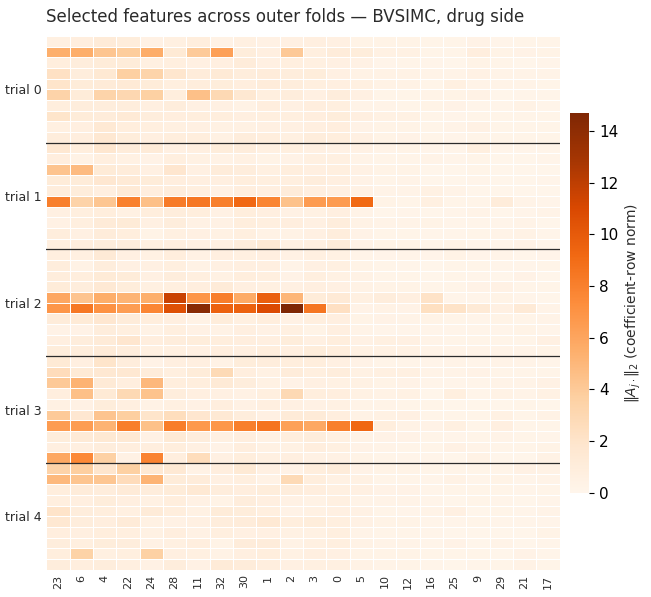

In [30]:
utils.fig_sel_heatmap(collected["bissgl"], "test_sel_B", top_n=33, n_orig=33,
                   feature_names=None, method_label="BVSIMC, drug side",
                   savepath=f"{FIG_DIR}/sel_heatmap_bissgl_B.pdf")

In [19]:
import gzip, pickle, glob

PATH_ROOT = (
    "/Users/sijianfan/projects/BiSSGL/outputs/results/realAnalysis/tuberculosis/fold_cv/comb"
)

# PATH_ROOT = (
#     "/Users/sijianfan/projects/BiSSGL/outputs/results/realAnalysis/tuberculosis/fold_cv/origin"
# )

# BiSSGL
files = sorted(glob.glob(f"{PATH_ROOT}/results_bissgl_*.gz"))
all_results = []
files

['/Users/sijianfan/projects/BiSSGL/outputs/results/realAnalysis/tuberculosis/fold_cv/comb/results_bissgl_20260430.gz',
 '/Users/sijianfan/projects/BiSSGL/outputs/results/realAnalysis/tuberculosis/fold_cv/comb/results_bissgl_20260805.gz']

In [20]:
for f in files:
    with gzip.open(f, "rb") as fin:
        all_results.extend(pickle.load(fin))
# optionally save merged file
with gzip.open(
    f"{PATH_ROOT}/results_bissgl.gz",
    "wb",
) as fout:
    pickle.dump(all_results, fout)